# Time-Series Forecasting of Carbon Monoxide and Nitrogen Dioxide Levels

Build predictive models to forecast daily or hourly concentrations of **CO(GT)** and **NO₂(GT)** based on historical data.


In [66]:
import tensorflow as tf
print("Num CPUs Available:", len(tf.config.list_physical_devices('CPU')))
print(tf.config.list_physical_devices())
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

Num CPUs Available: 1
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]
Num GPUs Available: 0


In [65]:
import torch
print("CUDA Available:", torch.cuda.is_available())
print("GPU Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detected")


CUDA Available: True
GPU Name: NVIDIA GeForce RTX 4060 Ti


In [111]:
import pandas as pd

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import r2_score, mean_squared_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import keras_tuner as kt
from sklearn.preprocessing import MinMaxScaler
from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.layers import LSTM, Dense,GRU

In [16]:
url = 'https://raw.githubusercontent.com/rashakil-ds/Public-Datasets/refs/heads/main/airquality.csv'
df = pd.read_csv(url)
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360,150,11.9,1046,166,1056,113,1692,1268,13.6,48.9,0.7578
1,2004-03-10,19:00:00,2.0,1292,112,9.4,955,103,1174,92,1559,972,13.3,47.7,0.7255
2,2004-03-10,20:00:00,2.2,1402,88,9.0,939,131,1140,114,1555,1074,11.9,54.0,0.7502
3,2004-03-10,21:00:00,2.2,1376,80,9.2,948,172,1092,122,1584,1203,11.0,60.0,0.7867
4,2004-03-10,22:00:00,1.6,1272,51,6.5,836,131,1205,116,1490,1110,11.2,59.6,0.7888


In [10]:
df.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')

# Project Workflow
<!-- 
### **Deliverables**:
1. **Forecasting Models**:
   - Trained models for `CO(GT)` and `NO₂(GT)`.
2. **Forecast Visualization**:
   - Plots showing historical trends and future predictions.
3. **Evaluation Report**:
   - Metrics and comparison of different forecasting models.
4. **Insights and Recommendations**:
   - Suggestions for mitigating high levels of these gases based on predictions. -->


### 1. Data Preprocessing
- **Date-Time Parsing**:
  - Combine the `Date` and `Time` columns into a single `datetime` column.
  - Set the `datetime` column as the index of the dataset.
- **Resampling**:
  - Aggregate the data into meaningful time intervals (e.g., hourly or daily averages).
- **Handle Missing Values**:
  - Use interpolation, mean, or advanced imputation techniques to fill missing data for `CO(GT)`.
- **Outlier Detection**:
  - Remove or cap extreme values in `CO(GT)` using statistical thresholds.

In [17]:
def clean_column(new_df, column_name):
    """
    Cleans a specific column in the dataset by handling missing, non-numeric, and invalid data.

    Parameters:
    - new_df (pd.DataFrame): The dataset.
    - column_name (str): The name of the column to clean.

    Returns:
    - pd.Series: The cleaned column.
    """

    # Step 1: Handle negative values
    if pd.api.types.is_numeric_dtype(new_df[column_name]):
       print(f"Checking for negative values in '{column_name}'.")
       negative_mask = new_df[column_name] < 0
       if negative_mask.sum() > 0:
         print(f"Negative values found in '{column_name}'. Replacing with column mean.")
         mean_value = new_df[new_df[column_name] >= 0][column_name].mean()
         new_df[column_name] = new_df[column_name].apply(lambda x: x if x >= 0 else mean_value)
        #  mean_value = new_df[column_name][new_df[column_name] >= 0].mean()  # Mean of non-negative values
        #  new_df.loc[negative_mask, column_name] = mean_value

    print(f"Column '{column_name}' cleaned successfully.")
    return new_df[column_name]


In [18]:
def inspect_unclean_data(new_df, column_name):
    """
    Inspect a specific column in the dataset by checking for missing, non-numeric, outliers and invalid data.

    Parameters:
    - new_df (pd.DataFrame): The dataset.
    - column_name (str): The name of the column to clean.

    Returns:
    - pd.Series: The uncleaned column.
    """
    print(f"Inspecting '{column_name}' for unclean data...\n")

    # 1. Check for missing values
    missing_values = new_df[column_name].isnull().sum()
    print(f"Missing values: {missing_values}\n")

    # 2. Check for invalid patterns
    pattern = r"[^0-9a-zA-Z\.\-\s]"
    invalid_pattern_mask = new_df[column_name].astype(str).str.contains(pattern, na=False)
    if invalid_pattern_mask.sum() > 0:
        print(f"Invalid patterns detected:")
        # print(new_df[invalid_pattern_mask], "\n")
        print(new_df.loc[invalid_pattern_mask, column_name], "\n")
    else:
        print("No invalid patterns detected.\n")

    # 3. Check for non-numeric values (if column should be numeric)
    non_numeric_mask = pd.to_numeric(new_df[column_name], errors='coerce').isnull()
    if non_numeric_mask.sum() > 0:
        print(f"Non-numeric values detected:")
        print(new_df.loc[non_numeric_mask, column_name], "\n")
    else:
        print("No non-numeric values detected.\n")

    # 4. Check for outliers
    from scipy.stats import zscore
    if pd.api.types.is_numeric_dtype(new_df[column_name]):
        z_scores = zscore(new_df[column_name].dropna())
        outliers = new_df[np.abs(z_scores) > 3]
        if not outliers.empty:
            print(f"Outliers detected:")
            print(outliers, "\n")
        else:
            print("No outliers detected.\n")

    # 5. Get unique values
    unique_values = new_df[column_name].unique()
    print(f"Unique values ({len(unique_values)} total): {unique_values[:10]}...\n")

    print(f"Inspection of '{column_name}' completed.\n")


In [19]:
def check_negative_value(new_df, column_name):
  plt.figure(figsize=(10, 6))
  new_df[column_name].hist(bins=50, edgecolor='k')
  plt.xlabel(column_name)
  plt.ylabel('Frequency')
  plt.title(f'Distribution of {column_name}')
  plt.show()


In [20]:
new_df=df.copy()

In [21]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   float64
 3   PT08.S1(CO)    9357 non-null   int64  
 4   NMHC(GT)       9357 non-null   int64  
 5   C6H6(GT)       9357 non-null   float64
 6   PT08.S2(NMHC)  9357 non-null   int64  
 7   NOx(GT)        9357 non-null   int64  
 8   PT08.S3(NOx)   9357 non-null   int64  
 9   NO2(GT)        9357 non-null   int64  
 10  PT08.S4(NO2)   9357 non-null   int64  
 11  PT08.S5(O3)    9357 non-null   int64  
 12  T              9357 non-null   float64
 13  RH             9357 non-null   float64
 14  AH             9357 non-null   float64
dtypes: float64(5), int64(8), object(2)
memory usage: 1.1+ MB


In [22]:
new_df['DateTime']=pd.to_datetime(new_df['Date']+' '+new_df['Time'])
new_df['DateTime'] = pd.date_range( start='2004-03-10 18:00:00', periods=len(new_df), freq='h')
new_df.set_index('DateTime',inplace=True)
new_df.drop(['Date','Time'],axis=1,inplace=True)
new_df.head(10)

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
DateTime,,,,,,,,,,,,,
2004-03-10 18:00:00,2.6,1360,150,11.9,1046,166,1056,113,1692,1268,13.6,48.9,0.7578
2004-03-10 19:00:00,2.0,1292,112,9.4,955,103,1174,92,1559,972,13.3,47.7,0.7255
2004-03-10 20:00:00,2.2,1402,88,9.0,939,131,1140,114,1555,1074,11.9,54.0,0.7502
2004-03-10 21:00:00,2.2,1376,80,9.2,948,172,1092,122,1584,1203,11.0,60.0,0.7867
2004-03-10 22:00:00,1.6,1272,51,6.5,836,131,1205,116,1490,1110,11.2,59.6,0.7888
2004-03-10 23:00:00,1.2,1197,38,4.7,750,89,1337,96,1393,949,11.2,59.2,0.7848
2004-03-11 00:00:00,1.2,1185,31,3.6,690,62,1462,77,1333,733,11.3,56.8,0.7603
2004-03-11 01:00:00,1.0,1136,31,3.3,672,62,1453,76,1333,730,10.7,60.0,0.7702
2004-03-11 02:00:00,0.9,1094,24,2.3,609,45,1579,60,1276,620,10.7,59.7,0.7648


CO(GT)
Checking for negative values in 'CO(GT)'.
Negative values found in 'CO(GT)'. Replacing with column mean.
Column 'CO(GT)' cleaned successfully.
Inspecting 'CO(GT)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                     CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  \
DateTime                                                                      
2004-03-11 19:00:00     6.9         1776       461      27.4           1488   
2004-03-12 20:00:00     6.6         1843       488      32.6           1610   
2004-03-15 09:00:00     8.1         1961       618      36.7           1701   
2004-03-15 19:00:00     8.0         2040       685      39.2           1754   
2004-03-15 20:00:00     6.5         1895       538      31.0           1573   
2004-03-17 09:00:00     6.6         1852       534      36.4           1696   
2004-03-17 19:00:00     7.6         1973       577      38.4           1737

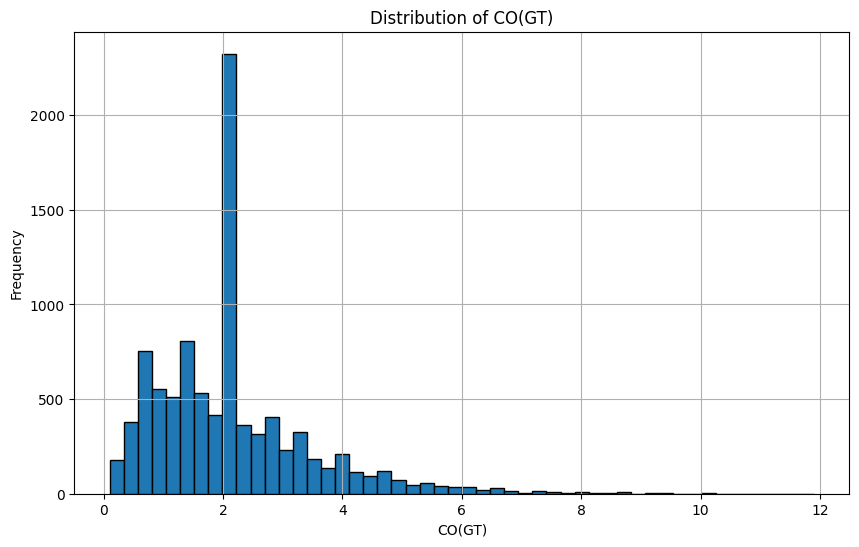

PT08.S1(CO)
Checking for negative values in 'PT08.S1(CO)'.
Negative values found in 'PT08.S1(CO)'. Replacing with column mean.
Column 'PT08.S1(CO)' cleaned successfully.
Inspecting 'PT08.S1(CO)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                       CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  \
DateTime                                                                        
2004-03-11 19:00:00   6.90000       1776.0       461      27.4           1488   
2004-03-12 20:00:00   6.60000       1843.0       488      32.6           1610   
2004-03-14 19:00:00   4.60000       1808.0       262      20.6           1312   
2004-03-14 20:00:00   5.90000       1898.0       341      23.1           1381   
2004-03-15 08:00:00   5.50000       1797.0       336      25.9           1451   
2004-03-15 09:00:00   8.10000       1961.0       618      36.7           1701   
2004-03-15 10:00:00   5.80000     

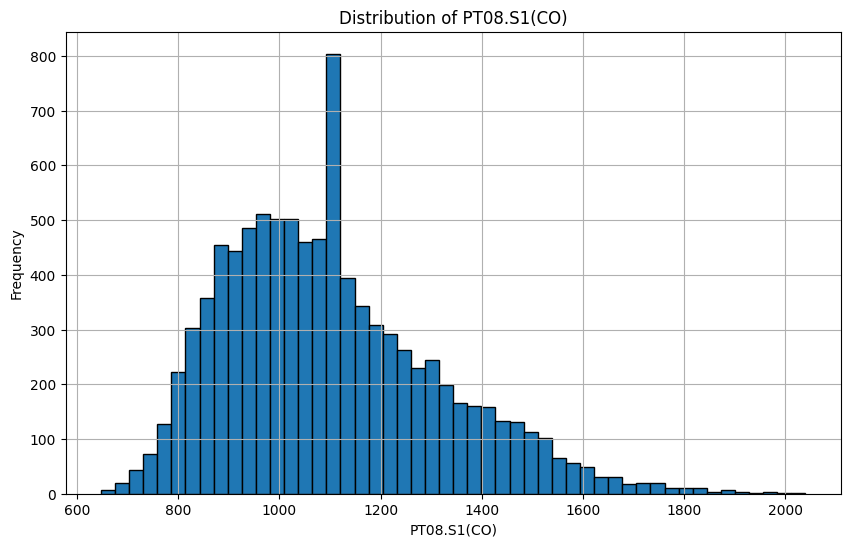

NMHC(GT)
Checking for negative values in 'NMHC(GT)'.
Negative values found in 'NMHC(GT)'. Replacing with column mean.
Column 'NMHC(GT)' cleaned successfully.
Inspecting 'NMHC(GT)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                      CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  \
DateTime                                                                       
2004-03-11 02:00:00  0.90000  1094.000000      24.0       2.3            609   
2004-03-11 03:00:00  0.60000  1010.000000      19.0       1.7            561   
2004-03-11 04:00:00  2.15275  1011.000000      14.0       1.3            527   
2004-03-11 05:00:00  0.70000  1066.000000       8.0       1.1            512   
2004-03-11 06:00:00  0.70000  1052.000000      16.0       1.6            553   
2004-03-11 19:00:00  6.90000  1776.000000     461.0      27.4           1488   
2004-03-11 23:00:00  1.00000   913.000000      26.0      

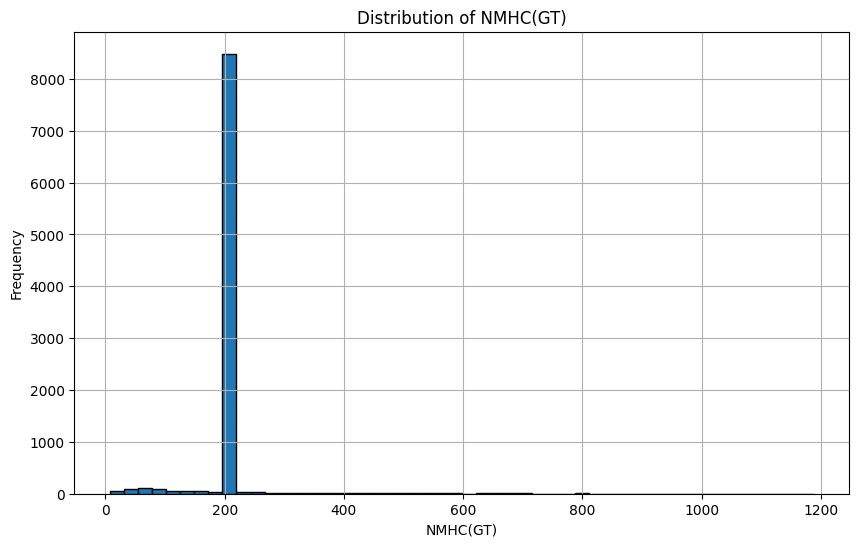

C6H6(GT)
Checking for negative values in 'C6H6(GT)'.
Negative values found in 'C6H6(GT)'. Replacing with column mean.
Column 'C6H6(GT)' cleaned successfully.
Inspecting 'C6H6(GT)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                       CO(GT)  PT08.S1(CO)     NMHC(GT)  C6H6(GT)  \
DateTime                                                            
2004-03-12 20:00:00   6.60000       1843.0   488.000000      32.6   
2004-03-15 09:00:00   8.10000       1961.0   618.000000      36.7   
2004-03-15 18:00:00   6.10000       1917.0   471.000000      32.1   
2004-03-15 19:00:00   8.00000       2040.0   685.000000      39.2   
2004-03-17 09:00:00   6.60000       1852.0   534.000000      36.4   
2004-03-17 19:00:00   7.60000       1973.0   577.000000      38.4   
2004-03-17 20:00:00   6.70000       1975.0   523.000000      35.1   
2004-03-18 09:00:00   6.60000       1934.0   506.000000      35.8   
2004-04

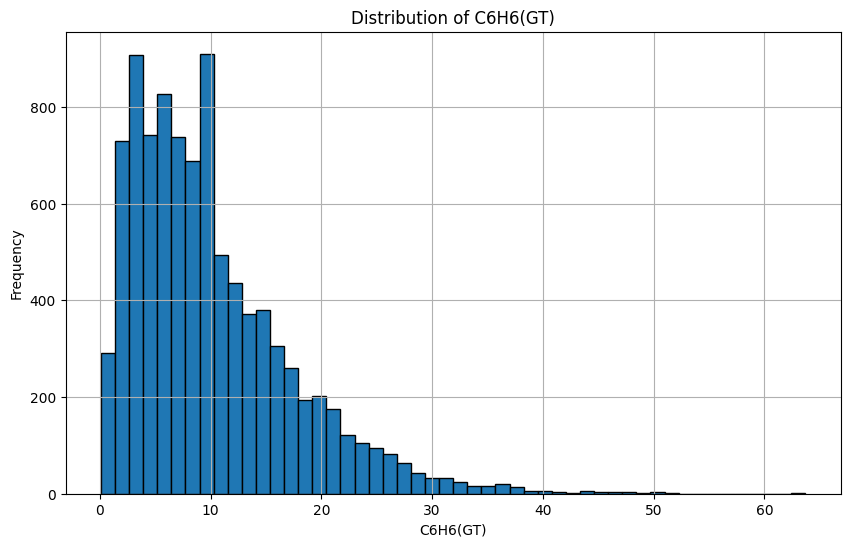

PT08.S2(NMHC)
Checking for negative values in 'PT08.S2(NMHC)'.
Negative values found in 'PT08.S2(NMHC)'. Replacing with column mean.
Column 'PT08.S2(NMHC)' cleaned successfully.
Inspecting 'PT08.S2(NMHC)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                       CO(GT)  PT08.S1(CO)    NMHC(GT)  C6H6(GT)  \
DateTime                                                           
2004-03-15 19:00:00   8.00000       2040.0  685.000000      39.2   
2004-03-17 19:00:00   7.60000       1973.0  577.000000      38.4   
2004-04-21 08:00:00   2.15275       1726.0  218.811816      40.3   
2004-05-18 08:00:00   6.50000       1745.0  218.811816      38.9   
2004-05-26 09:00:00   4.00000       1303.0  218.811816      40.2   
2004-09-21 08:00:00   7.30000       1587.0  218.811816      41.2   
2004-09-28 19:00:00   7.50000       1479.0  218.811816      39.3   
2004-10-04 18:00:00   2.15275       1694.0  218.811816      

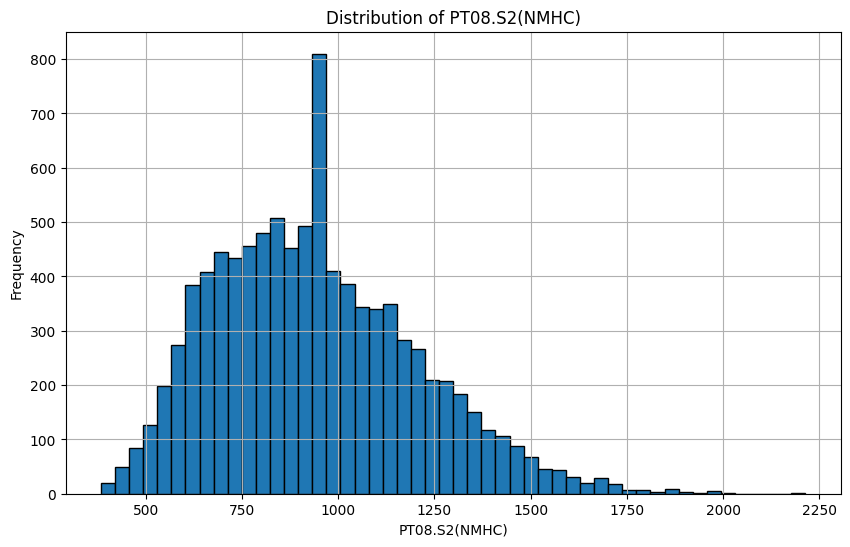

NOx(GT)
Checking for negative values in 'NOx(GT)'.
Negative values found in 'NOx(GT)'. Replacing with column mean.
Column 'NOx(GT)' cleaned successfully.
Inspecting 'NOx(GT)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                       CO(GT)  PT08.S1(CO)    NMHC(GT)   C6H6(GT)  \
DateTime                                                            
2004-09-13 21:00:00   3.00000  1317.000000  218.811816  19.900000   
2004-10-20 17:00:00   8.00000  1884.000000  218.811816  43.700000   
2004-10-25 18:00:00   8.40000  1824.000000  218.811816  44.500000   
2004-10-26 17:00:00   8.40000  1822.000000  218.811816  45.900000   
2004-10-26 18:00:00   9.50000  1908.000000  218.811816  52.100000   
2004-11-02 11:00:00   5.80000  1570.000000  218.811816  32.900000   
2004-11-02 20:00:00   9.20000  1778.000000  218.811816  48.200000   
2004-11-04 17:00:00   2.15275  1915.000000  218.811816  45.900000   
2004-11-04 1

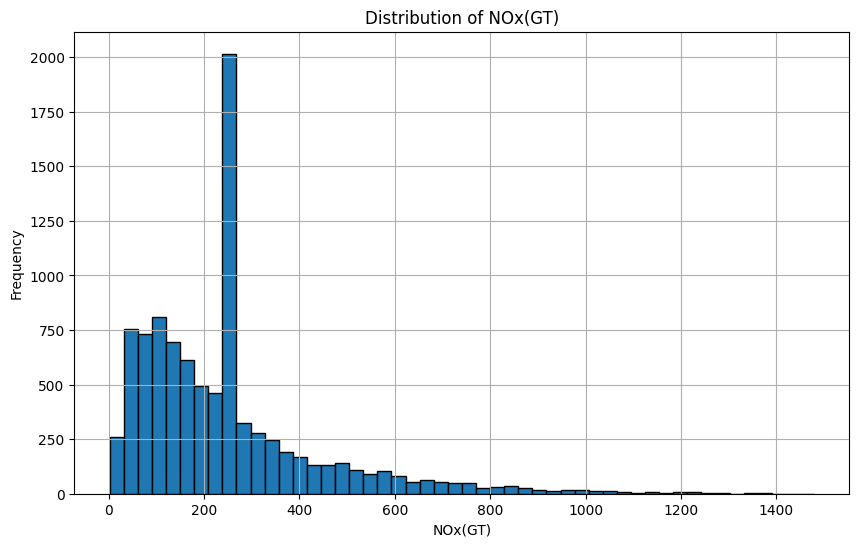

PT08.S3(NOx)
Checking for negative values in 'PT08.S3(NOx)'.
Negative values found in 'PT08.S3(NOx)'. Replacing with column mean.
Column 'PT08.S3(NOx)' cleaned successfully.
Inspecting 'PT08.S3(NOx)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                      CO(GT)  PT08.S1(CO)    NMHC(GT)  C6H6(GT)  \
DateTime                                                          
2004-03-11 03:00:00  0.60000       1010.0   19.000000       1.7   
2004-03-11 04:00:00  2.15275       1011.0   14.000000       1.3   
2004-03-11 05:00:00  0.70000       1066.0    8.000000       1.1   
2004-03-11 06:00:00  0.70000       1052.0   16.000000       1.6   
2004-03-12 03:00:00  0.80000        889.0   21.000000       1.9   
2004-03-12 04:00:00  2.15275        831.0   10.000000       1.1   
2004-03-12 05:00:00  0.60000        847.0    7.000000       1.0   
2004-03-12 06:00:00  0.80000        927.0   17.000000       1.8   
2004-03

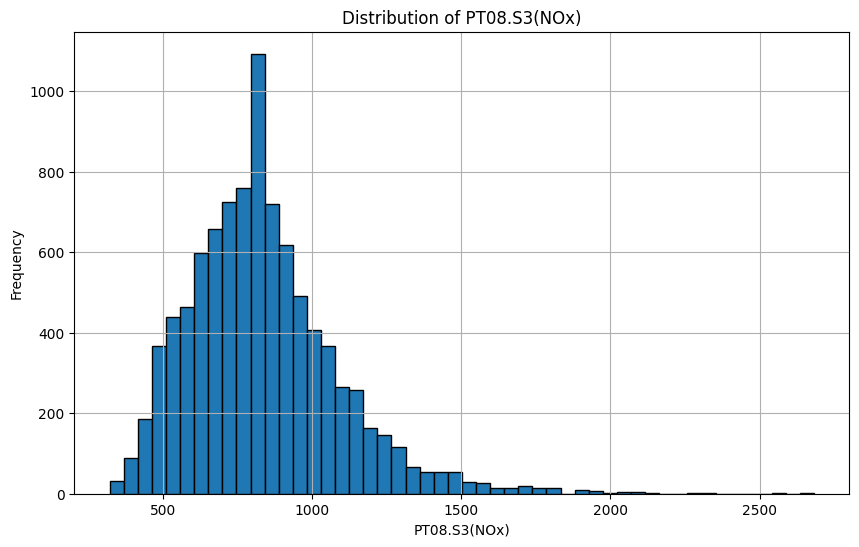

NO2(GT)
Checking for negative values in 'NO2(GT)'.
Negative values found in 'NO2(GT)'. Replacing with column mean.
Column 'NO2(GT)' cleaned successfully.
Inspecting 'NO2(GT)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                     CO(GT)  PT08.S1(CO)    NMHC(GT)   C6H6(GT)  \
DateTime                                                          
2004-11-17 17:00:00     7.8  1659.000000  218.811816  35.900000   
2004-11-17 19:00:00     6.6  1549.000000  218.811816  30.100000   
2004-11-17 20:00:00     4.3  1407.000000  218.811816  22.000000   
2004-11-17 21:00:00     4.9  1374.000000  218.811816  19.000000   
2004-11-18 09:00:00     5.6  1503.000000  218.811816  27.800000   
2004-11-18 10:00:00     5.6  1446.000000  218.811816  22.900000   
2004-11-18 11:00:00     4.7  1416.000000  218.811816  20.200000   
2004-11-18 12:00:00     4.2  1448.000000  218.811816  19.700000   
2004-11-22 19:00:00     6.9  176

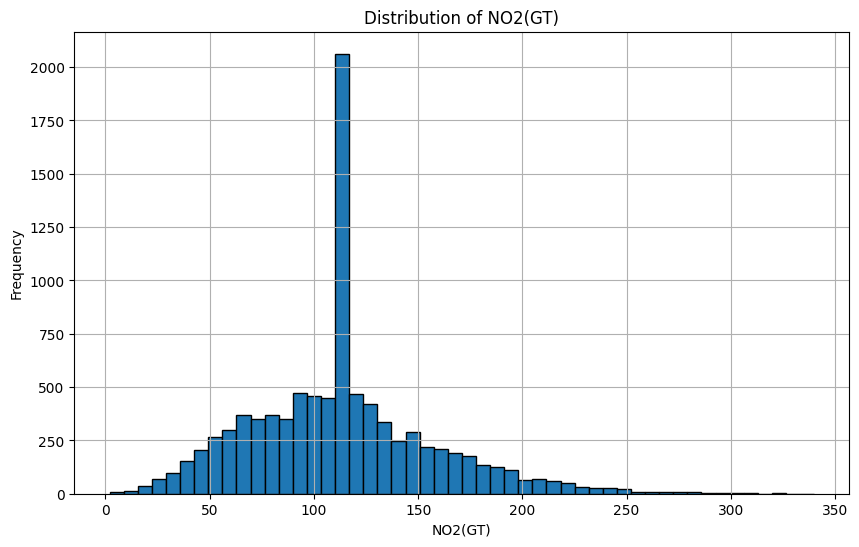

PT08.S4(NO2)
Checking for negative values in 'PT08.S4(NO2)'.
Negative values found in 'PT08.S4(NO2)'. Replacing with column mean.
Column 'PT08.S4(NO2)' cleaned successfully.
Inspecting 'PT08.S4(NO2)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                       CO(GT)  PT08.S1(CO)     NMHC(GT)  C6H6(GT)  \
DateTime                                                            
2004-03-15 09:00:00   8.10000       1961.0   618.000000      36.7   
2004-03-15 19:00:00   8.00000       2040.0   685.000000      39.2   
2004-03-17 09:00:00   6.60000       1852.0   534.000000      36.4   
2004-04-06 08:00:00   6.20000       1757.0  1084.000000      33.7   
2004-04-21 08:00:00   2.15275       1726.0   218.811816      40.3   
2004-04-29 08:00:00   7.20000       1771.0  1129.000000      36.2   
2004-04-29 19:00:00   6.50000       1761.0   830.000000      32.6   
2004-05-10 08:00:00   2.15275       1598.0   218.811816 

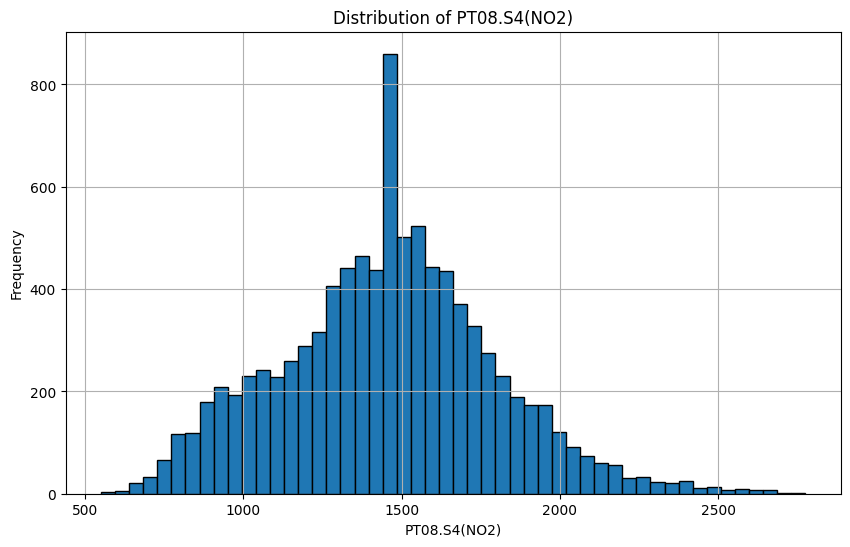

PT08.S5(O3)
Checking for negative values in 'PT08.S5(O3)'.
Negative values found in 'PT08.S5(O3)'. Replacing with column mean.
Column 'PT08.S5(O3)' cleaned successfully.
Inspecting 'PT08.S5(O3)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                       CO(GT)  PT08.S1(CO)    NMHC(GT)  C6H6(GT)  \
DateTime                                                           
2004-03-17 19:00:00   7.60000       1973.0  577.000000      38.4   
2004-03-17 20:00:00   6.70000       1975.0  523.000000      35.1   
2004-06-03 09:00:00   2.15275       1234.0  218.811816      20.8   
2004-07-06 18:00:00   4.40000       1298.0  218.811816      25.0   
2004-09-09 18:00:00   5.40000       1425.0  218.811816      32.3   
2004-09-28 10:00:00   3.70000       1274.0  218.811816      19.9   
2004-10-20 17:00:00   8.00000       1884.0  218.811816      43.7   
2004-10-22 18:00:00   8.40000       1808.0  218.811816      40.0   
20

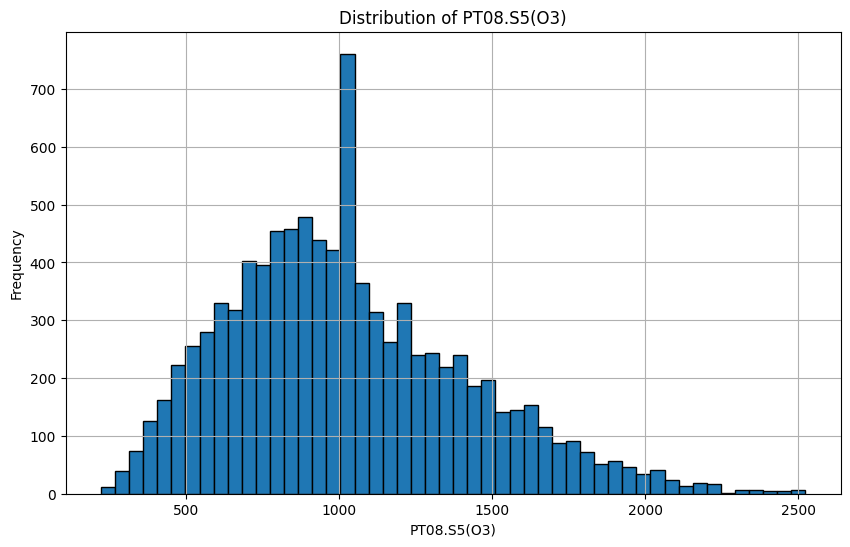

T
Checking for negative values in 'T'.
Negative values found in 'T'. Replacing with column mean.
Column 'T' cleaned successfully.
Inspecting 'T' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                     CO(GT)  PT08.S1(CO)    NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  \
DateTime                                                                        
2004-07-22 15:00:00     2.1       1158.0  218.811816      14.3         1126.0   
2004-07-22 16:00:00     2.3       1186.0  218.811816      15.1         1151.0   

                     NOx(GT)  PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  \
DateTime                                                            
2004-07-22 15:00:00    153.0         693.0    143.0        1654.0   
2004-07-22 16:00:00    166.0         680.0    157.0        1686.0   

                     PT08.S5(O3)     T    RH      AH  
DateTime                                              
2004-07-22 15:00:00 

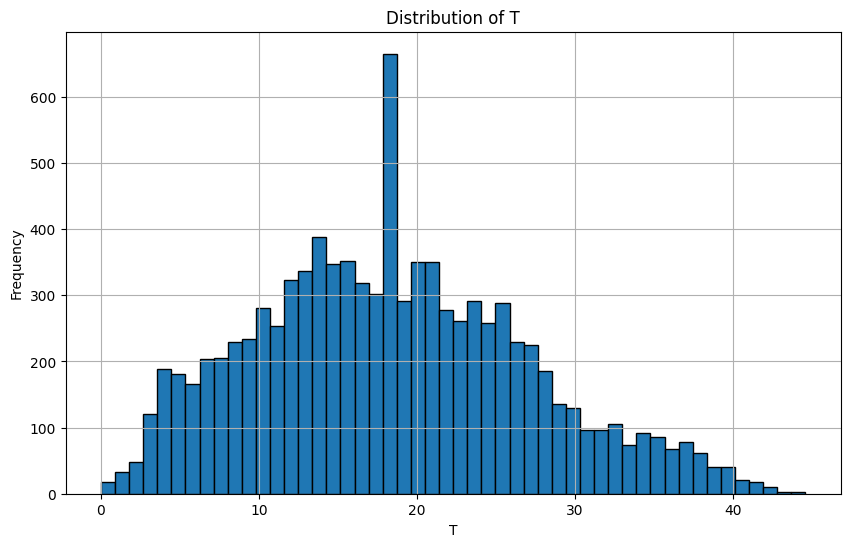

RH
Checking for negative values in 'RH'.
Negative values found in 'RH'. Replacing with column mean.
Column 'RH' cleaned successfully.
Inspecting 'RH' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (754 total): [48.9 47.7 54.  60.  59.6 59.2 56.8 59.7 60.2 60.5]...

Inspection of 'RH' completed.



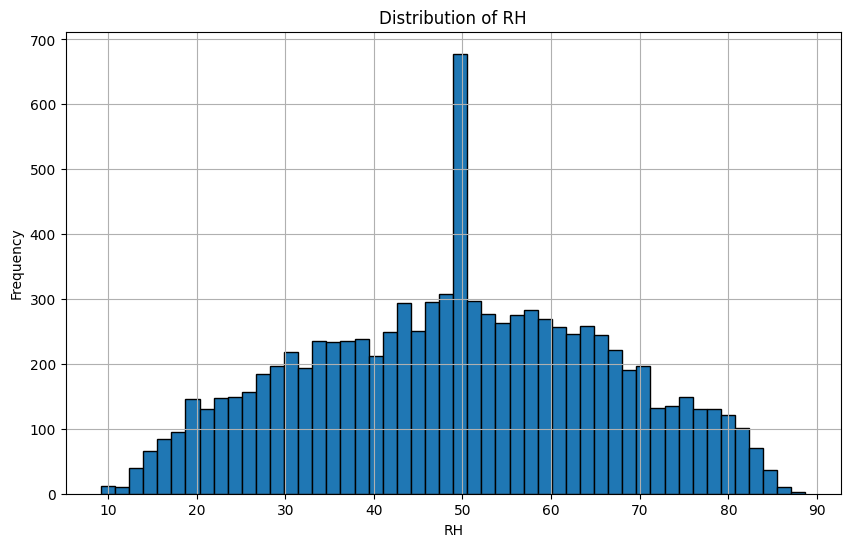

AH
Checking for negative values in 'AH'.
Negative values found in 'AH'. Replacing with column mean.
Column 'AH' cleaned successfully.
Inspecting 'AH' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                      CO(GT)  PT08.S1(CO)    NMHC(GT)  C6H6(GT)  \
DateTime                                                          
2004-09-12 16:00:00  2.15275       1254.0  218.811816       6.6   

                     PT08.S2(NMHC)     NOx(GT)  PT08.S3(NOx)     NO2(GT)  \
DateTime                                                                   
2004-09-12 16:00:00          840.0  246.896735         787.0  113.091251   

                     PT08.S4(NO2)  PT08.S5(O3)     T    RH     AH  
DateTime                                                           
2004-09-12 16:00:00        1602.0        846.0  26.1  66.8  2.231   

Unique values (6684 total): [0.7578 0.7255 0.7502 0.7867 0.7888 0.7848 0.7603 0.7702 0.764

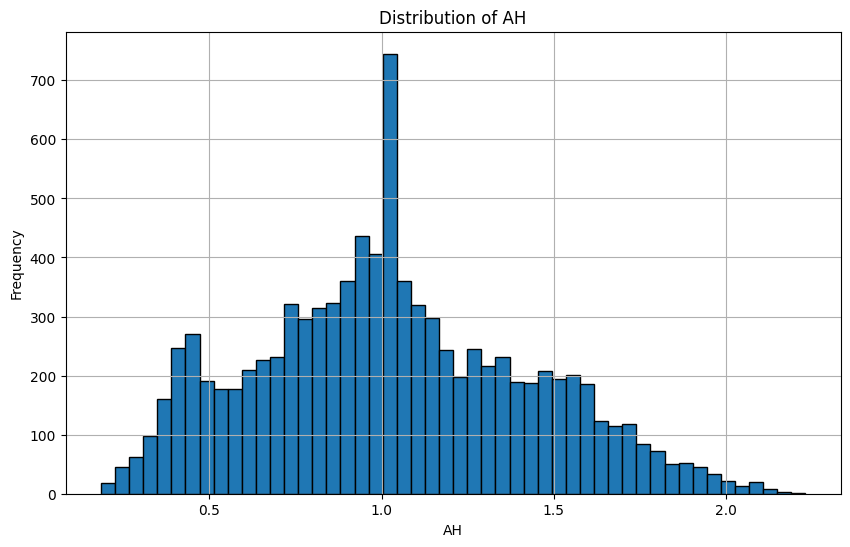

In [23]:
for i in new_df.columns:
  print(i)
  clean_column(new_df, i)
  inspect_unclean_data(new_df, i)
  check_negative_value(new_df, i)

In [24]:
new_df['NMHC(GT)'].describe()

count    9357.000000
mean      218.811816
std        63.870229
min         7.000000
25%       218.811816
50%       218.811816
75%       218.811816
max      1189.000000
Name: NMHC(GT), dtype: float64

Column: CO(GT)
Column: PT08.S1(CO)


C:\Users\User\AppData\Local\Temp\ipykernel_20788\3085157208.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df[i])
C:\Users\User\AppData\Local\Temp\ipykernel_20788\3085157208.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df[i])


Column: NMHC(GT)
Column: C6H6(GT)
Column: PT08.S2(NMHC)


C:\Users\User\AppData\Local\Temp\ipykernel_20788\3085157208.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df[i])
C:\Users\User\AppData\Local\Temp\ipykernel_20788\3085157208.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df[i])
C:\Users\User\AppData\Local\Temp\ipykernel_20788\3

Column: NOx(GT)
Column: PT08.S3(NOx)
Column: NO2(GT)

C:\Users\User\AppData\Local\Temp\ipykernel_20788\3085157208.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df[i])
C:\Users\User\AppData\Local\Temp\ipykernel_20788\3085157208.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df[i])
C:\Users\User\AppData\Local\Temp\ipykernel_20788\3


Column: PT08.S4(NO2)


C:\Users\User\AppData\Local\Temp\ipykernel_20788\3085157208.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df[i])


Column: PT08.S5(O3)
Column: T
Column: RH


C:\Users\User\AppData\Local\Temp\ipykernel_20788\3085157208.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df[i])
C:\Users\User\AppData\Local\Temp\ipykernel_20788\3085157208.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df[i])
C:\Users\User\AppData\Local\Temp\ipykernel_20788\3

Column: AH


C:\Users\User\AppData\Local\Temp\ipykernel_20788\3085157208.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df[i])


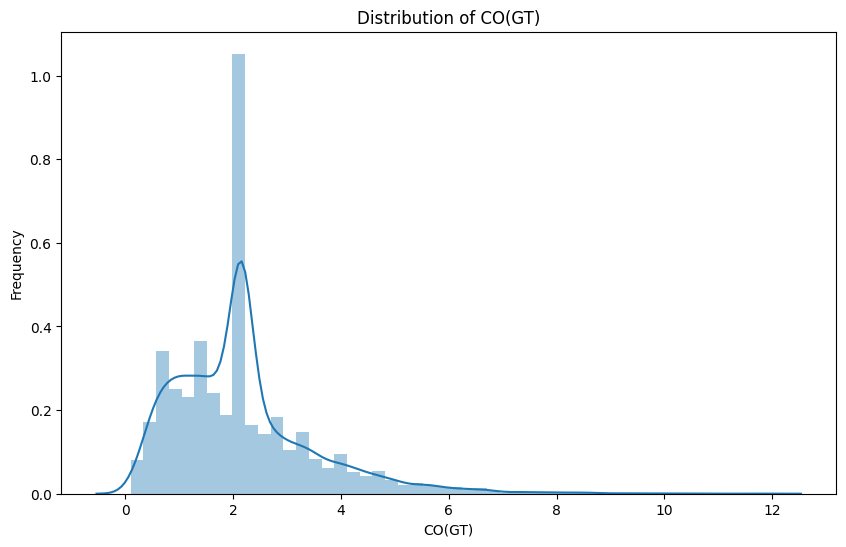

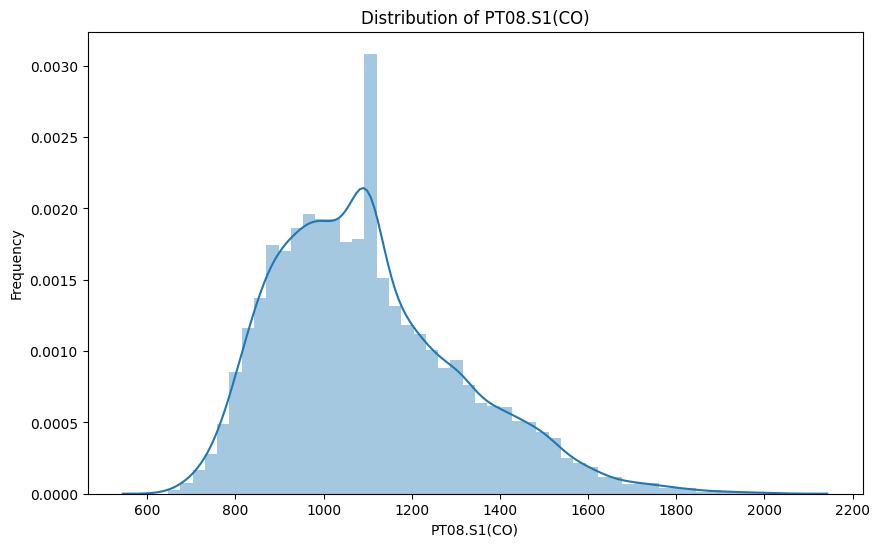

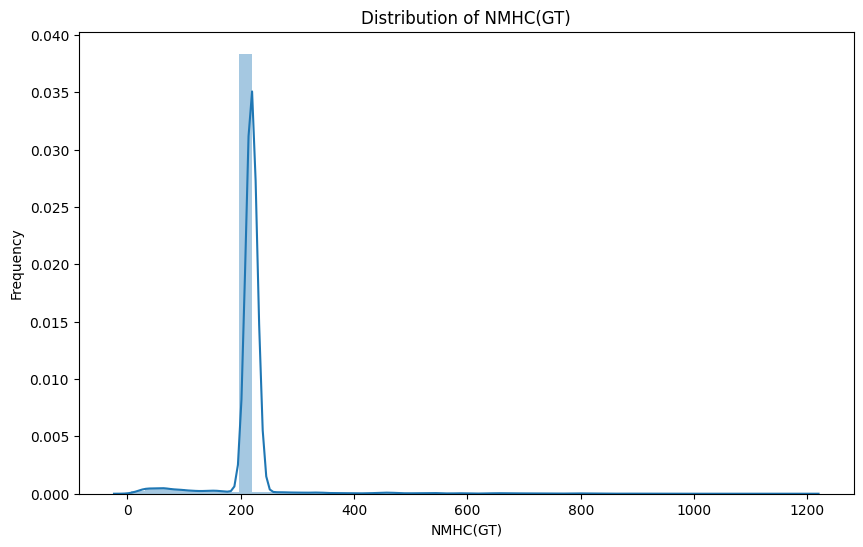

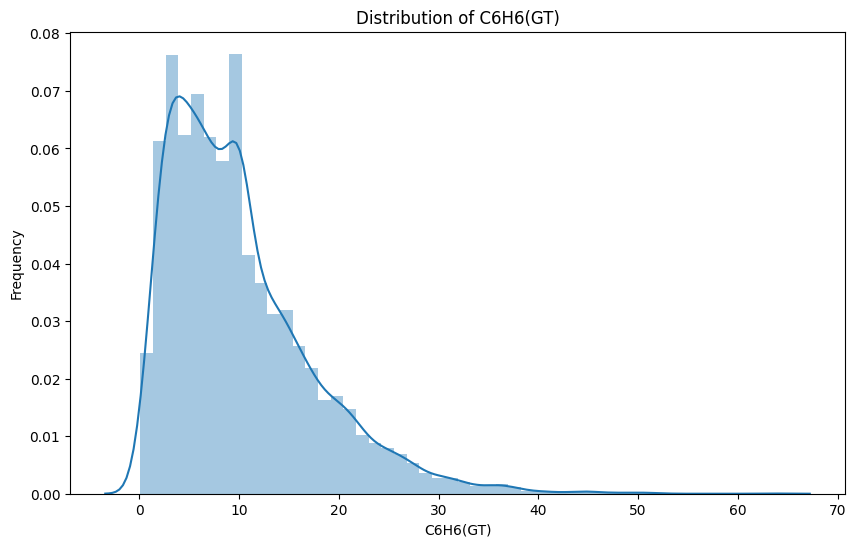

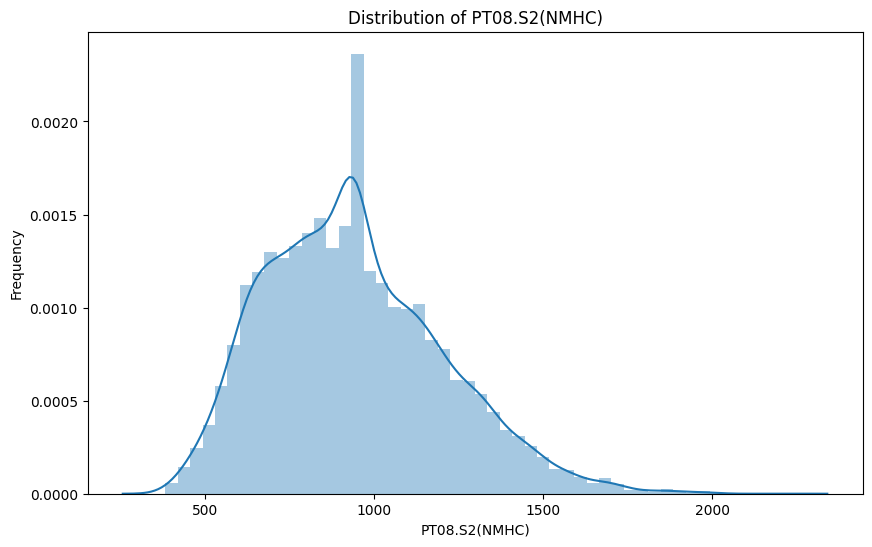

...

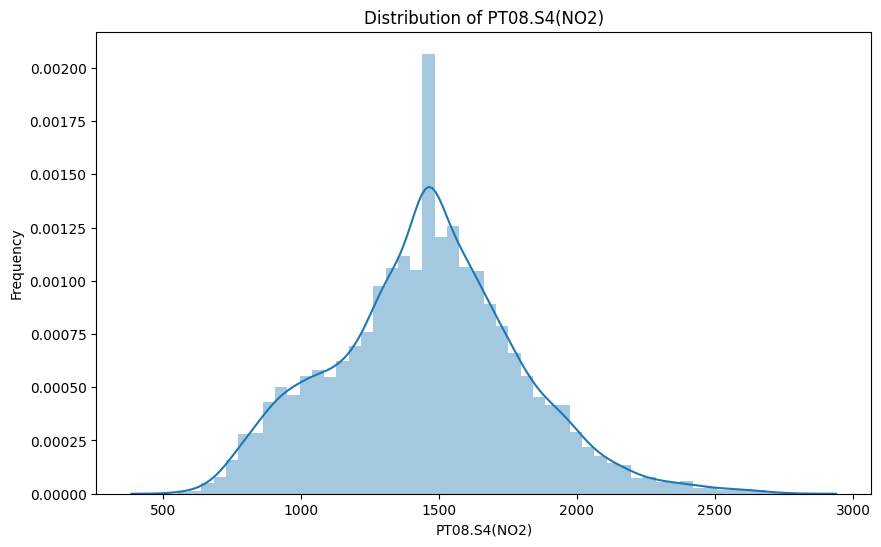

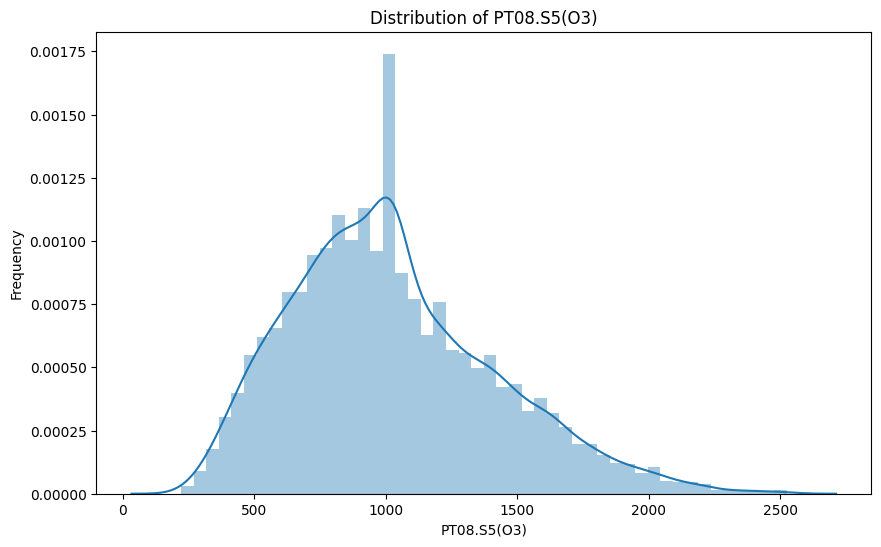

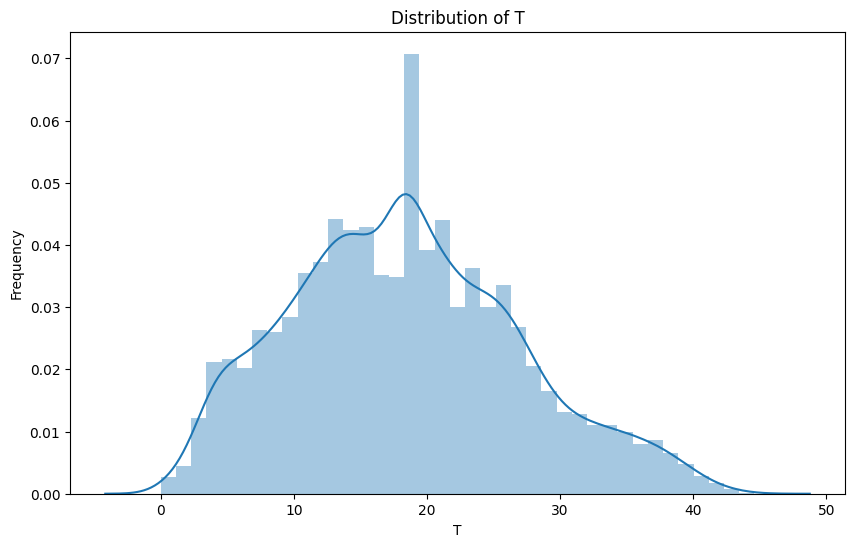

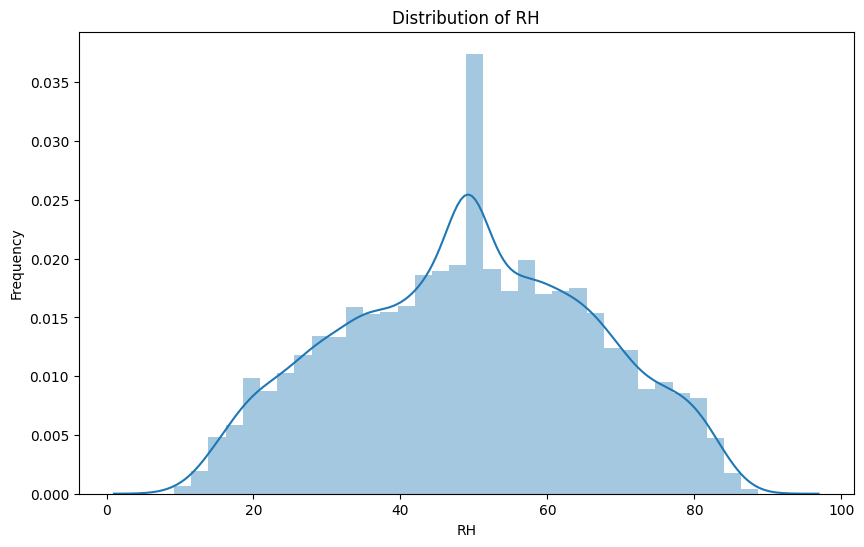

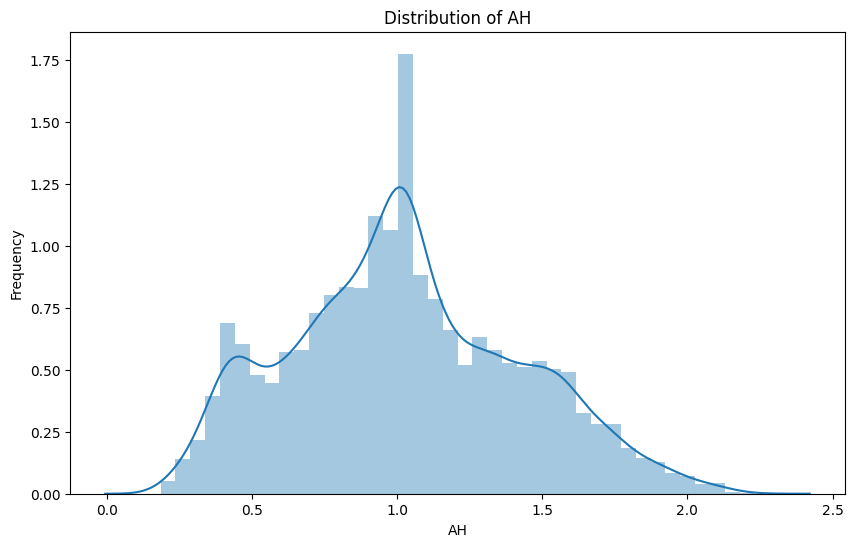

In [25]:
for i in new_df.select_dtypes(include=np.number).columns:
    print(f'Column: {i}')
    plt.figure(figsize=(10, 6))
    sns.distplot(new_df[i])
    plt.xlabel(i)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {i}')

Column: CO(GT)
Column: PT08.S1(CO)
Column: NMHC(GT)
Column: C6H6(GT)
Column: PT08.S2(NMHC)
Column: NOx(GT)
Column: PT08.S3(NOx)
Column: NO2(GT)
Column: PT08.S4(NO2)
Column: PT08.S5(O3)
Column: T
Column: RH
Column: AH


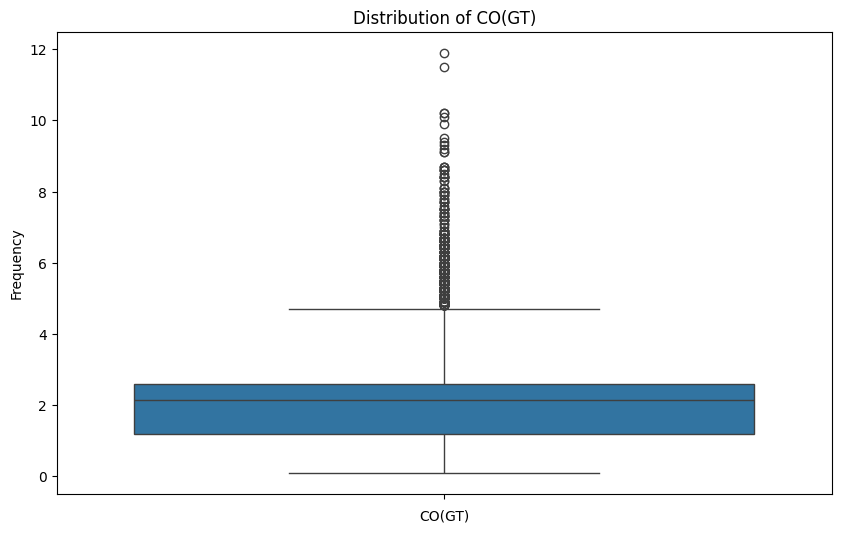

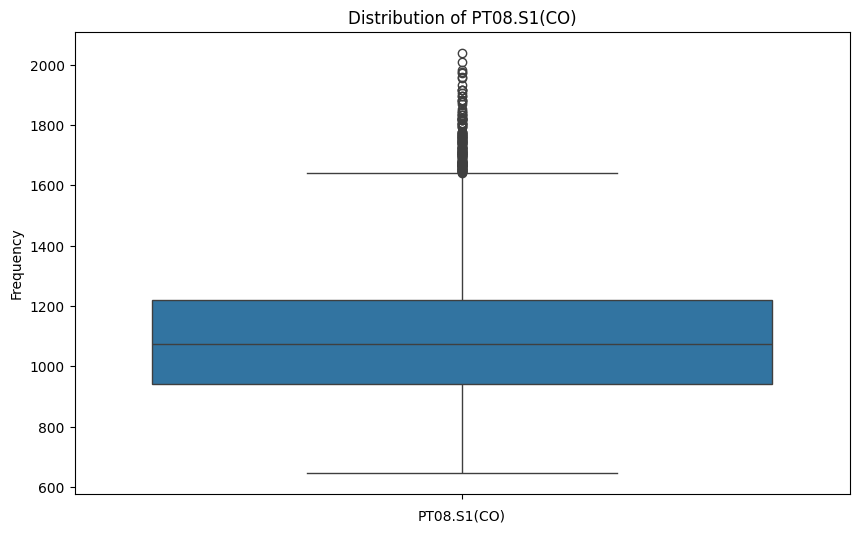

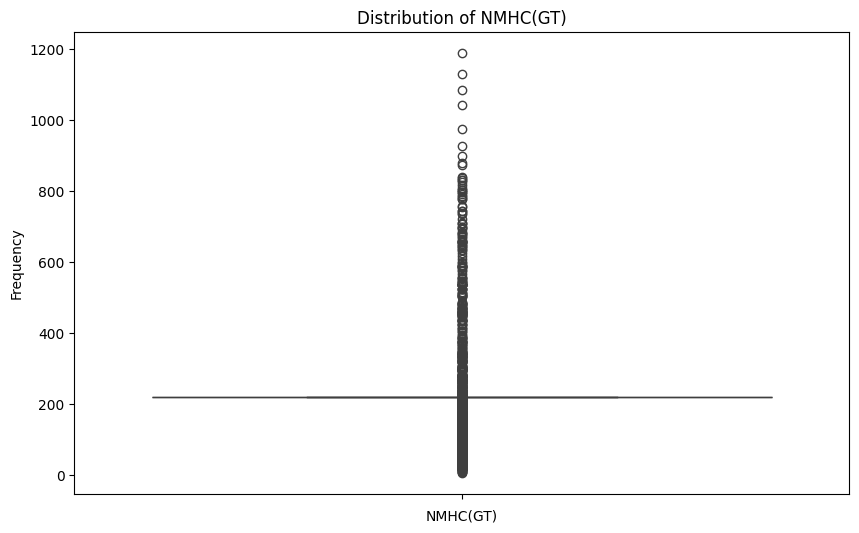

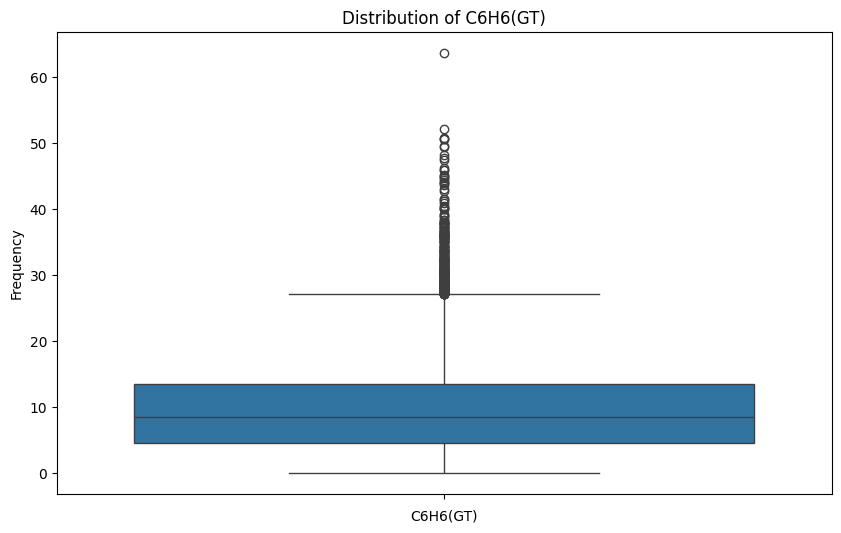

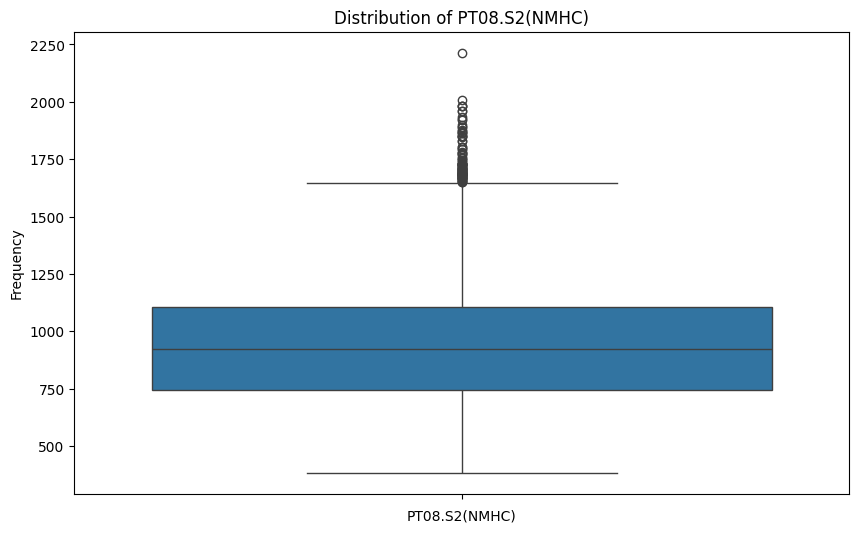

...

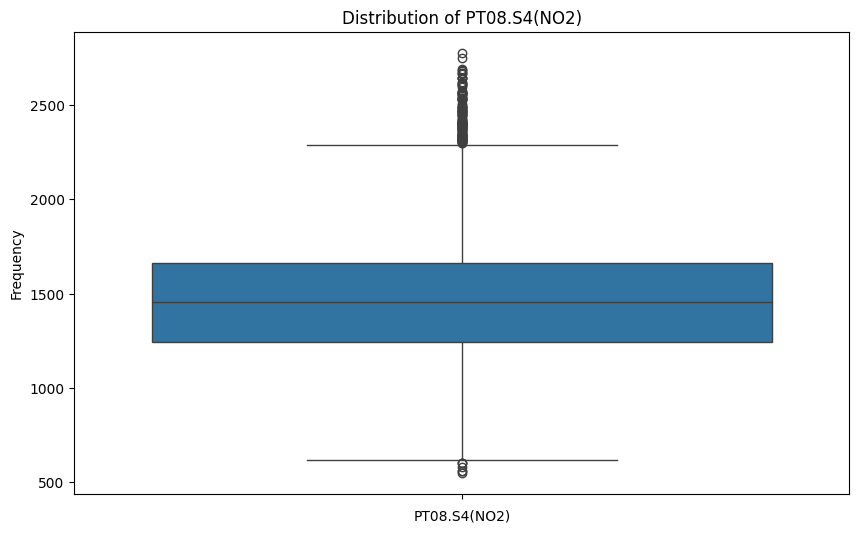

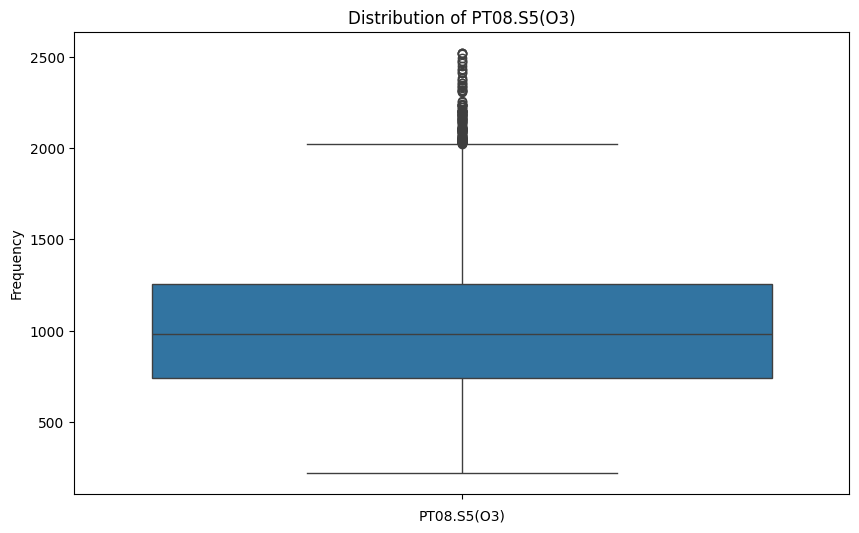

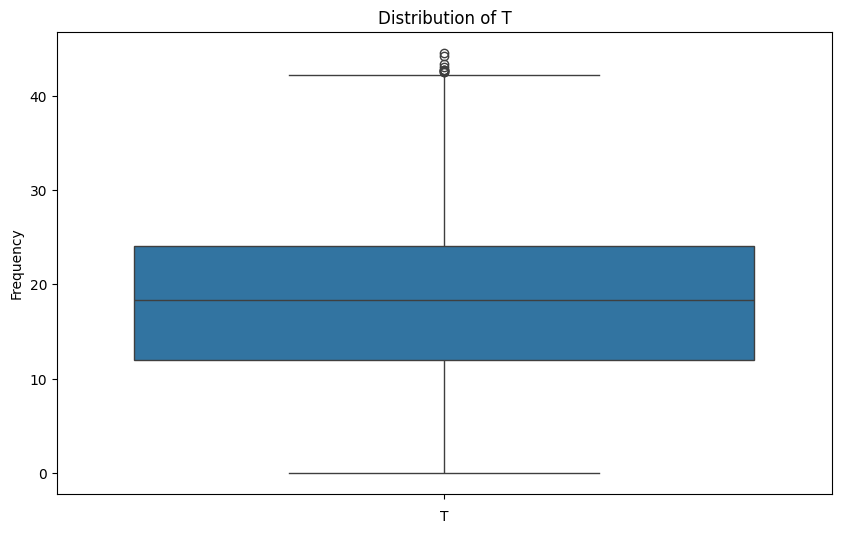

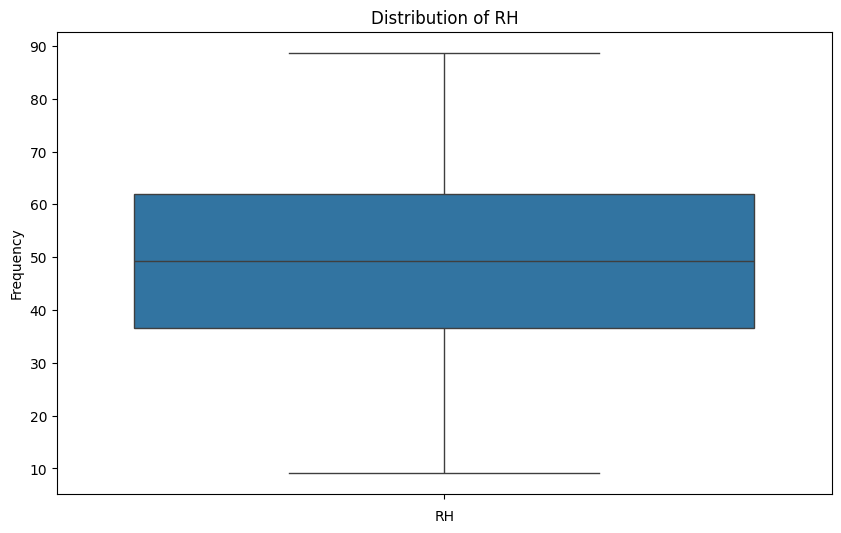

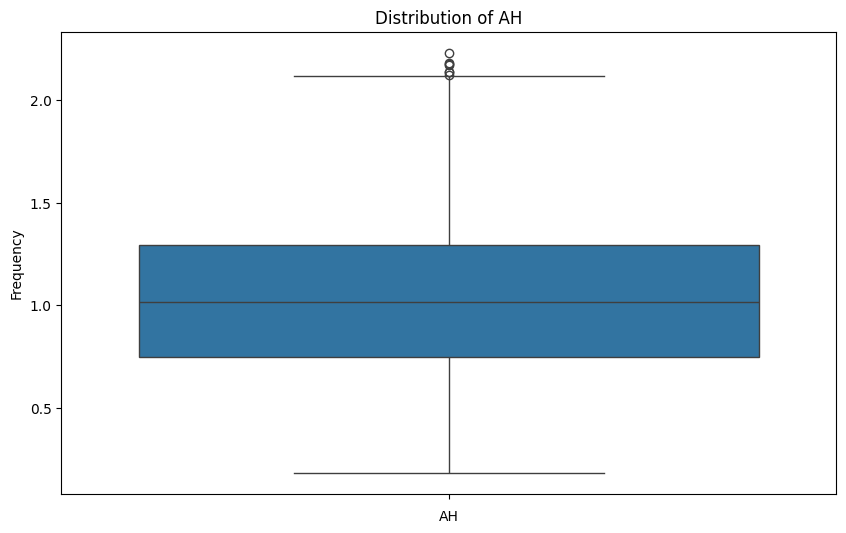

In [26]:
for i in new_df.select_dtypes(include=np.number).columns:
    print(f'Column: {i}')
    plt.figure(figsize=(10, 6))
    sns.boxplot(new_df[i])
    plt.xlabel(i)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {i}')

In [27]:
for i in ['CO(GT)', 'NO2(GT)', 'C6H6(GT)','NOx(GT)','PT08.S1(CO)','PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'AH']:
    print(f'Column: {i}')
    new_df[i].describe()
    upper_limit = new_df[i].quantile(0.75) + 1.5*( new_df[i].quantile(0.75) - new_df[i].quantile(0.25))
    lower_limit = new_df[i].quantile(0.75) - 1.5*( new_df[i].quantile(0.75) - new_df[i].quantile(0.25))

    new_df[i] = np.where(new_df[i] > upper_limit, upper_limit, np.where(new_df[i] < lower_limit, lower_limit, new_df[i]))


Column: CO(GT)
Column: NO2(GT)
Column: C6H6(GT)
Column: NOx(GT)
Column: PT08.S1(CO)
Column: PT08.S2(NMHC)
Column: PT08.S3(NOx)
Column: PT08.S4(NO2)
Column: PT08.S5(O3)
Column: T
Column: AH


CO(GT)
Checking for negative values in 'CO(GT)'.
Column 'CO(GT)' cleaned successfully.
Inspecting 'CO(GT)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (44 total): [2.6        2.         2.2        1.6        1.2        1.
 0.9        0.6        2.15274954 0.7       ]...

Inspection of 'CO(GT)' completed.



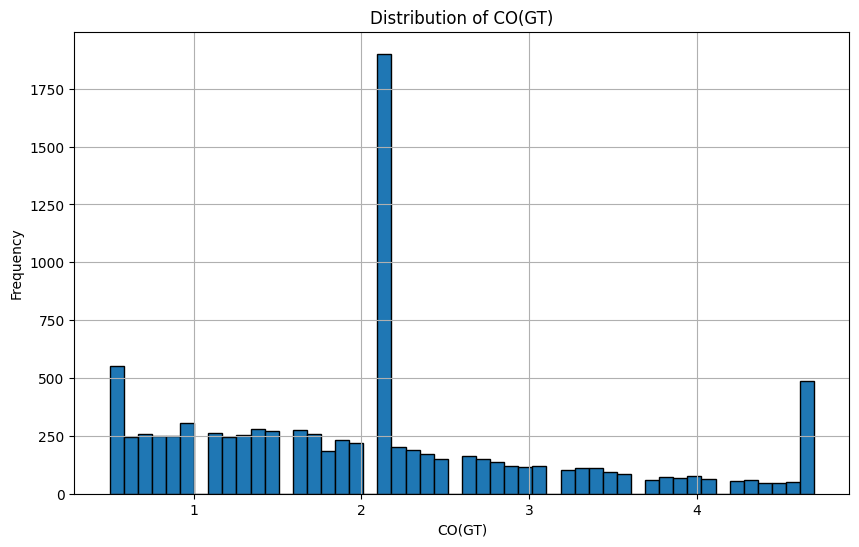

PT08.S1(CO)
Checking for negative values in 'PT08.S1(CO)'.
Column 'PT08.S1(CO)' cleaned successfully.
Inspecting 'PT08.S1(CO)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (826 total): [1360. 1292. 1402. 1376. 1272. 1197. 1185. 1136. 1094. 1010.]...

Inspection of 'PT08.S1(CO)' completed.



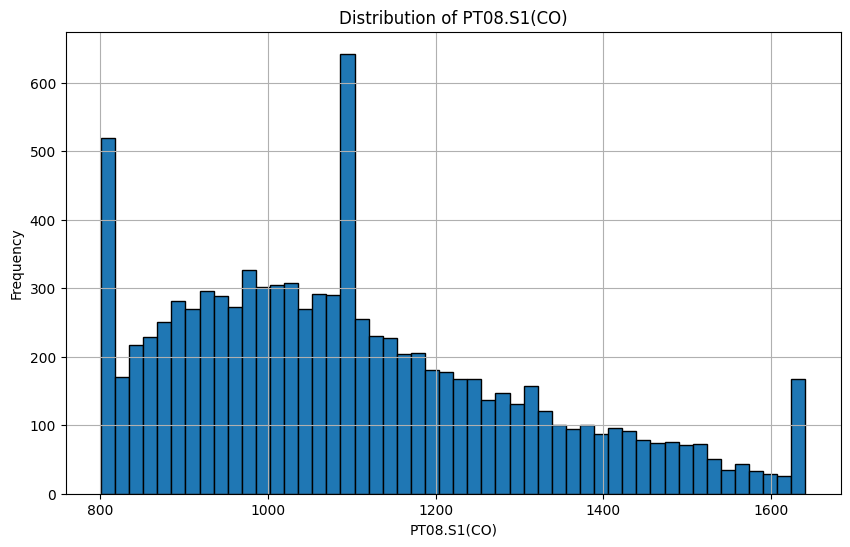

NMHC(GT)
Checking for negative values in 'NMHC(GT)'.
Column 'NMHC(GT)' cleaned successfully.
Inspecting 'NMHC(GT)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

Outliers detected:
                      CO(GT)  PT08.S1(CO)  NMHC(GT)   C6H6(GT)  PT08.S2(NMHC)  \
DateTime                                                                        
2004-03-11 02:00:00  0.90000  1094.000000      24.0   2.300000     609.000000   
2004-03-11 03:00:00  0.60000  1010.000000      19.0   1.700000     562.000000   
2004-03-11 04:00:00  2.15275  1011.000000      14.0   1.300000     562.000000   
2004-03-11 05:00:00  0.70000  1066.000000       8.0   1.100000     562.000000   
2004-03-11 06:00:00  0.70000  1052.000000      16.0   1.600000     562.000000   
2004-03-11 19:00:00  4.70000  1641.000000     461.0  27.100000    1488.000000   
2004-03-11 23:00:00  1.00000   913.000000      26.0   2.600000     629.000000   
2004-03-12 03:00:00  0.80000   88

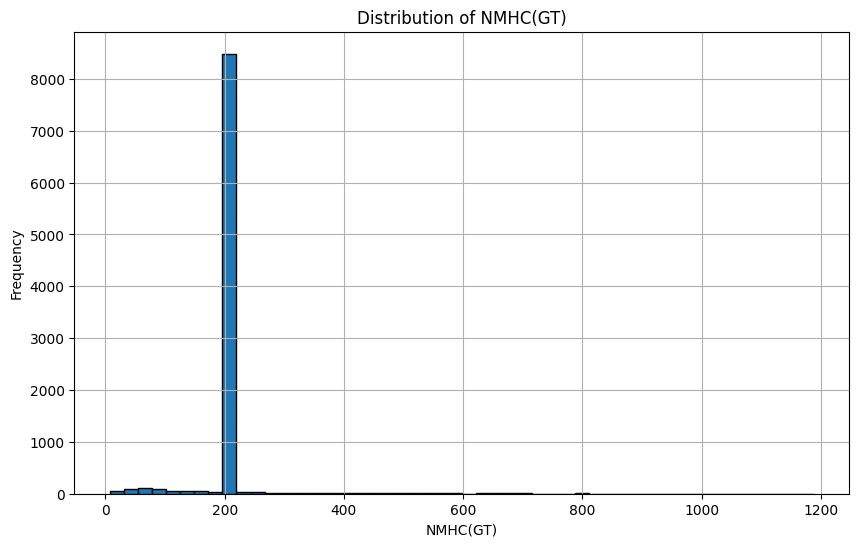

C6H6(GT)
Checking for negative values in 'C6H6(GT)'.
Column 'C6H6(GT)' cleaned successfully.
Inspecting 'C6H6(GT)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (272 total): [11.9  9.4  9.   9.2  6.5  4.7  3.6  3.3  2.3  1.7]...

Inspection of 'C6H6(GT)' completed.



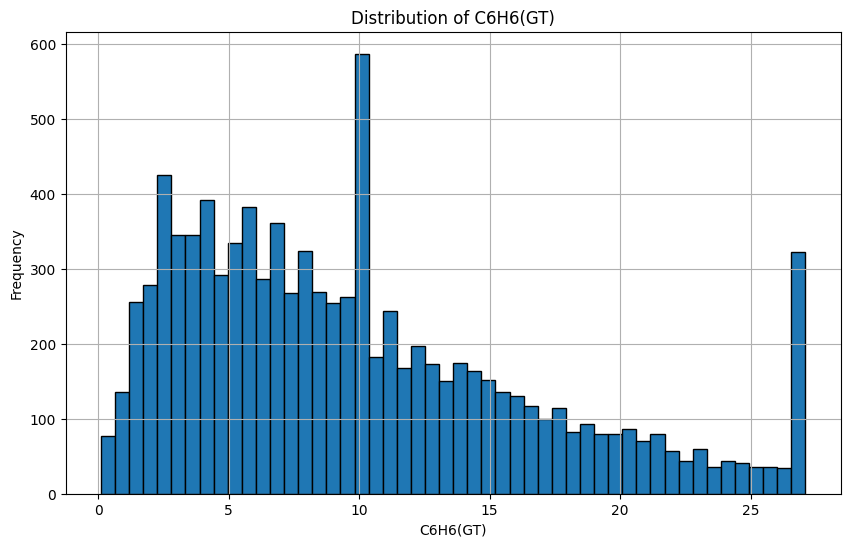

PT08.S2(NMHC)
Checking for negative values in 'PT08.S2(NMHC)'.
Column 'PT08.S2(NMHC)' cleaned successfully.
Inspecting 'PT08.S2(NMHC)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (1026 total): [1046.  955.  939.  948.  836.  750.  690.  672.  609.  562.]...

Inspection of 'PT08.S2(NMHC)' completed.



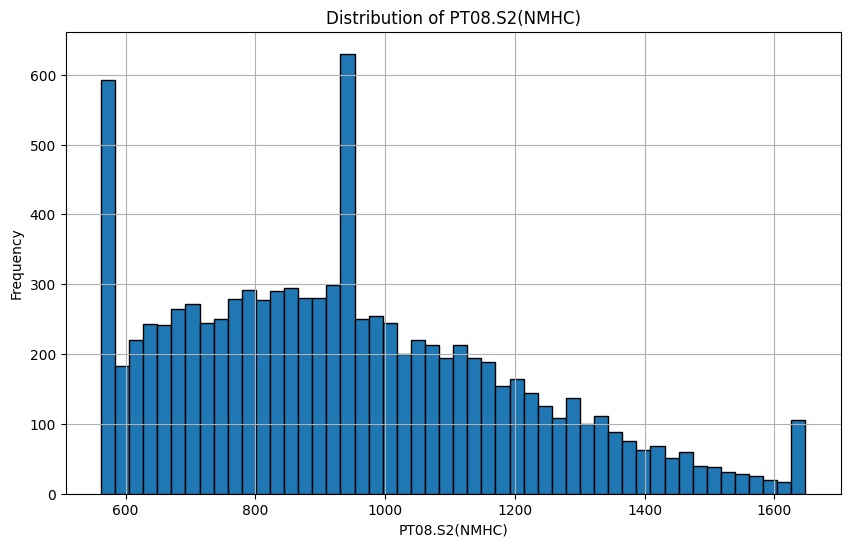

NOx(GT)
Checking for negative values in 'NOx(GT)'.
Column 'NOx(GT)' cleaned successfully.
Inspecting 'NOx(GT)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (516 total): [166.         103.         131.         172.          89.
  62.          45.         246.89673491  26.          34.        ]...

Inspection of 'NOx(GT)' completed.



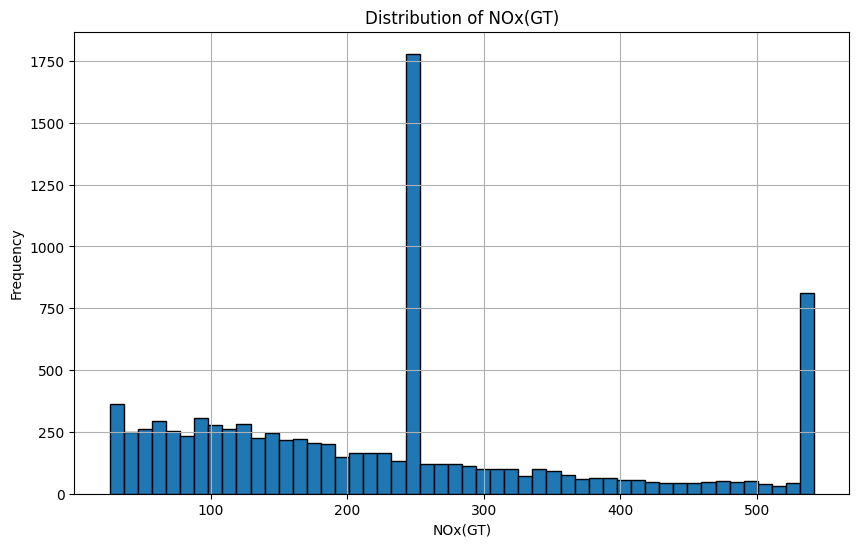

PT08.S3(NOx)
Checking for negative values in 'PT08.S3(NOx)'.
Column 'PT08.S3(NOx)' cleaned successfully.
Inspecting 'PT08.S3(NOx)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (852 total): [1056. 1174. 1140. 1092. 1205. 1337. 1401. 1136. 1079. 1218.]...

Inspection of 'PT08.S3(NOx)' completed.



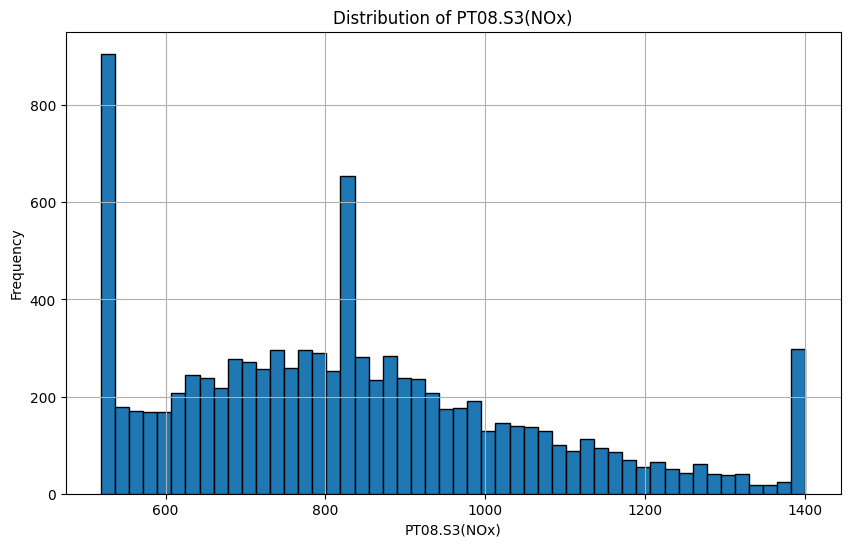

NO2(GT)
Checking for negative values in 'NO2(GT)'.
Column 'NO2(GT)' cleaned successfully.
Inspecting 'NO2(GT)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (144 total): [113.          92.         114.         122.         116.
  96.          77.          76.          62.5        113.09125081]...

Inspection of 'NO2(GT)' completed.



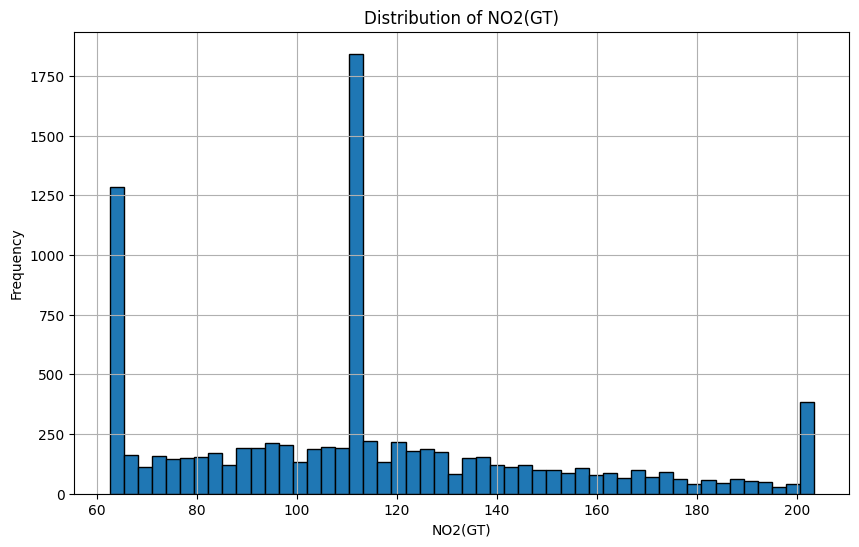

PT08.S4(NO2)
Checking for negative values in 'PT08.S4(NO2)'.
Column 'PT08.S4(NO2)' cleaned successfully.
Inspecting 'PT08.S4(NO2)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (1172 total): [1692. 1559. 1555. 1584. 1490. 1393. 1333. 1276. 1235. 1197.]...

Inspection of 'PT08.S4(NO2)' completed.



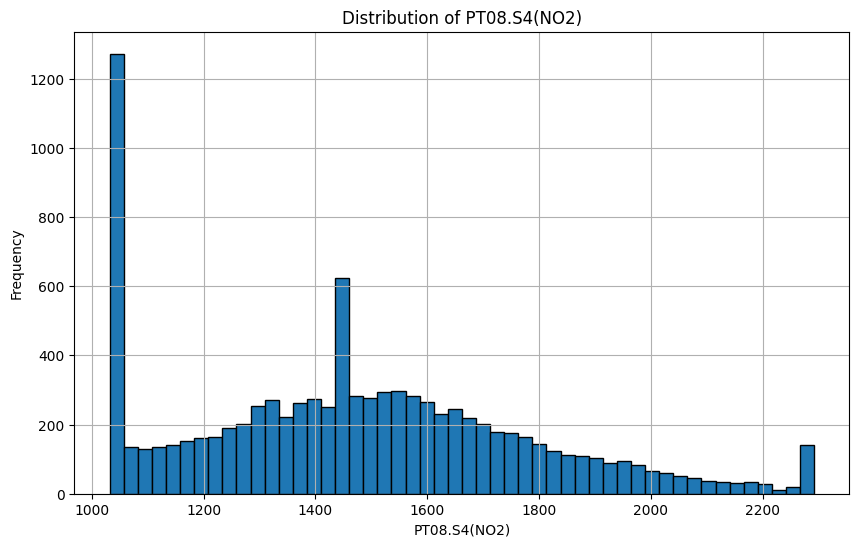

PT08.S5(O3)
Checking for negative values in 'PT08.S5(O3)'.
Column 'PT08.S5(O3)' cleaned successfully.
Inspecting 'PT08.S5(O3)' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (1439 total): [1268.  972. 1074. 1203. 1110.  949.  733.  730.  620.  501.]...

Inspection of 'PT08.S5(O3)' completed.



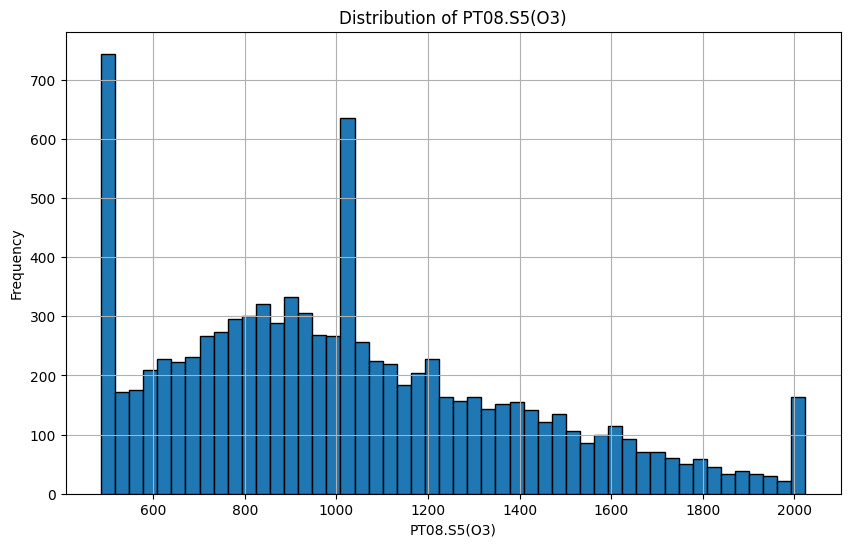

T
Checking for negative values in 'T'.
Column 'T' cleaned successfully.
Inspecting 'T' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (362 total): [13.6 13.3 11.9 11.  11.2 11.3 10.7 10.3 10.1 10.5]...

Inspection of 'T' completed.



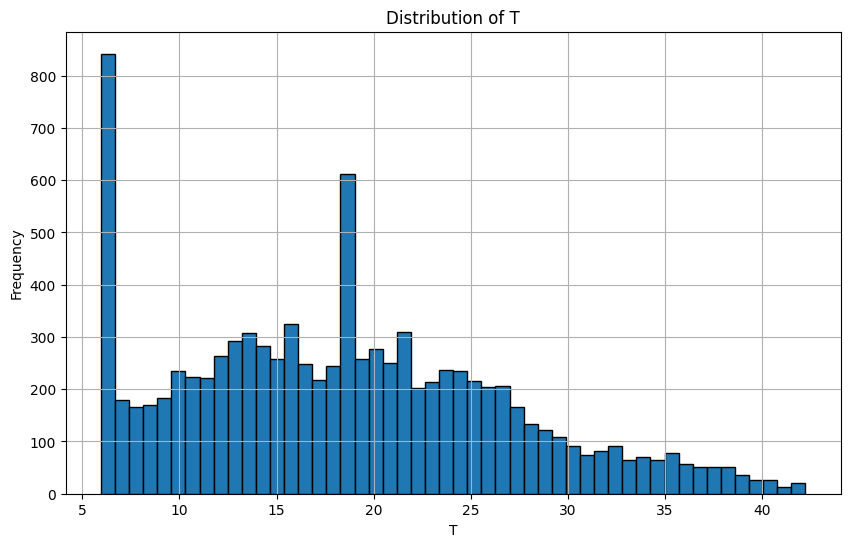

RH
Checking for negative values in 'RH'.
Column 'RH' cleaned successfully.
Inspecting 'RH' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (754 total): [48.9 47.7 54.  60.  59.6 59.2 56.8 59.7 60.2 60.5]...

Inspection of 'RH' completed.



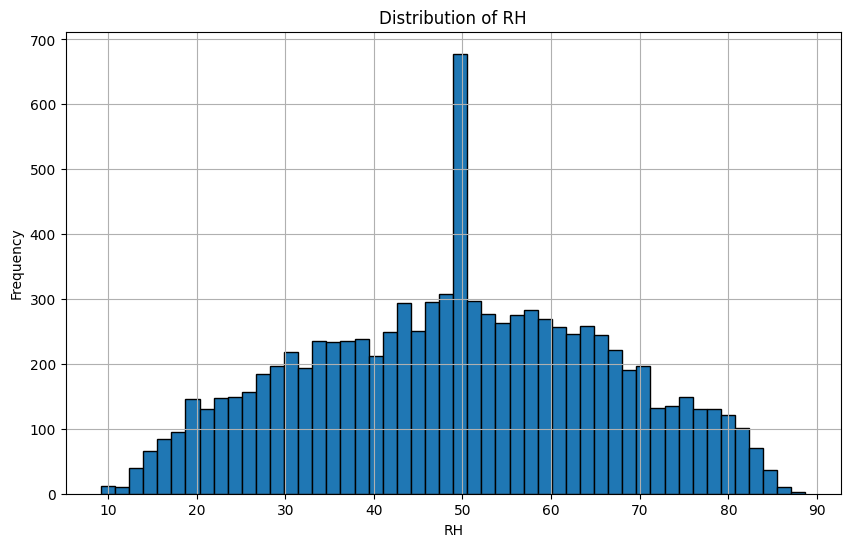

AH
Checking for negative values in 'AH'.
Column 'AH' cleaned successfully.
Inspecting 'AH' for unclean data...

Missing values: 0

No invalid patterns detected.

No non-numeric values detected.

No outliers detected.

Unique values (5941 total): [0.7578 0.7255 0.7502 0.7867 0.7888 0.7848 0.7603 0.7702 0.7648 0.7517]...

Inspection of 'AH' completed.



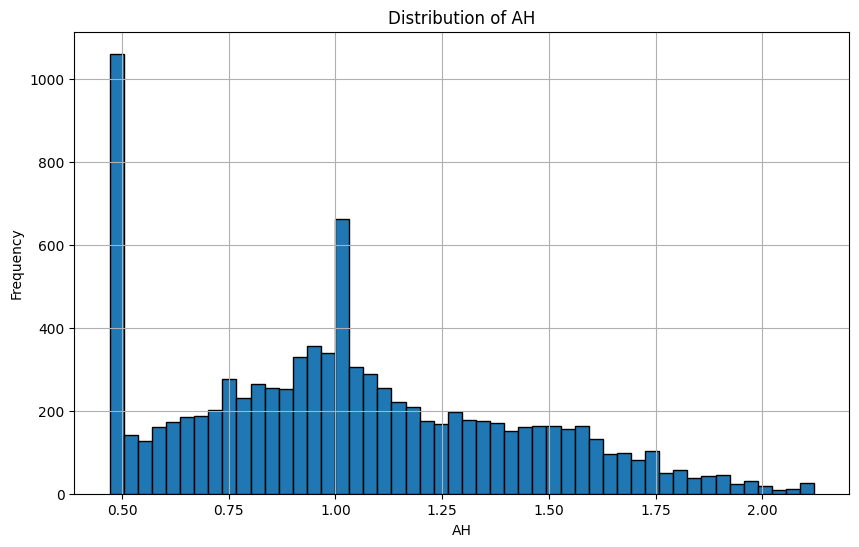

In [28]:
for i in new_df.columns:
  print(i)
  clean_column(new_df, i)
  inspect_unclean_data(new_df, i)
  check_negative_value(new_df, i)

In [29]:
# for i in new_df.select_dtypes(include=np.number).columns:
#     print(f'Column: {i}')
#     upper_limit = new_df[i].mean() + 3*new_df[i].std()
#     lower_limit = new_df[i].mean() - 3*new_df[i].std()

#     new_df[i] = np.where(new_df[i] > upper_limit, upper_limit, np.where(new_df[i] < lower_limit, lower_limit, new_df[i]))

In [30]:
new_df

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
DateTime,,,,,,,,,,,,,
2004-03-10 18:00:00,2.60000,1360.000000,150.000000,11.900000,1046.000000,166.000000,1056.000000,113.000000,1692.000000,1268.000000,13.600000,48.900000,0.75780
2004-03-10 19:00:00,2.00000,1292.000000,112.000000,9.400000,955.000000,103.000000,1174.000000,92.000000,1559.000000,972.000000,13.300000,47.700000,0.72550
2004-03-10 20:00:00,2.20000,1402.000000,88.000000,9.000000,939.000000,131.000000,1140.000000,114.000000,1555.000000,1074.000000,11.900000,54.000000,0.75020
2004-03-10 21:00:00,2.20000,1376.000000,80.000000,9.200000,948.000000,172.000000,1092.000000,122.000000,1584.000000,1203.000000,11.000000,60.000000,0.78670
2004-03-10 22:00:00,1.60000,1272.000000,51.000000,6.500000,836.000000,131.000000,1205.000000,116.000000,1490.000000,1110.000000,11.200000,59.600000,0.78880
2004-03-10 23:00:00,1.20000,1197.000000,38.000000,4.700000,750.000000,89.000000,1337.000000,96.000000,1393.000000,949.000000,11.200000,59.200000,0.78480
2004-03-11 00:00:00,1.20000,1185.000000,31.000000,3.600000,690.000000,62.000000,1401.000000,77.000000,1333.000000,733.000000,11.300000,56.800000,0.76030
2004-03-11 01:00:00,1.00000,1136.000000,31.000000,3.300000,672.000000,62.000000,1401.000000,76.000000,1333.000000,730.000000,10.700000,60.000000,0.77020
2004-03-11 02:00:00,0.90000,1094.000000,24.000000,2.300000,609.000000,45.000000,1401.000000,62.500000,1276.000000,620.000000,10.700000,59.700000,0.76480


### 2. Exploratory Data Analysis (EDA)
- **Trend Analysis**:
  - Visualize the long-term trends of `CO(GT)`.
- **Seasonality**:
  - Identify seasonal patterns (e.g., daily or yearly fluctuations).
- **Correlation Analysis**:
  - Explore relationships between `CO(GT)`, and other features (e.g., temperature or humidity).


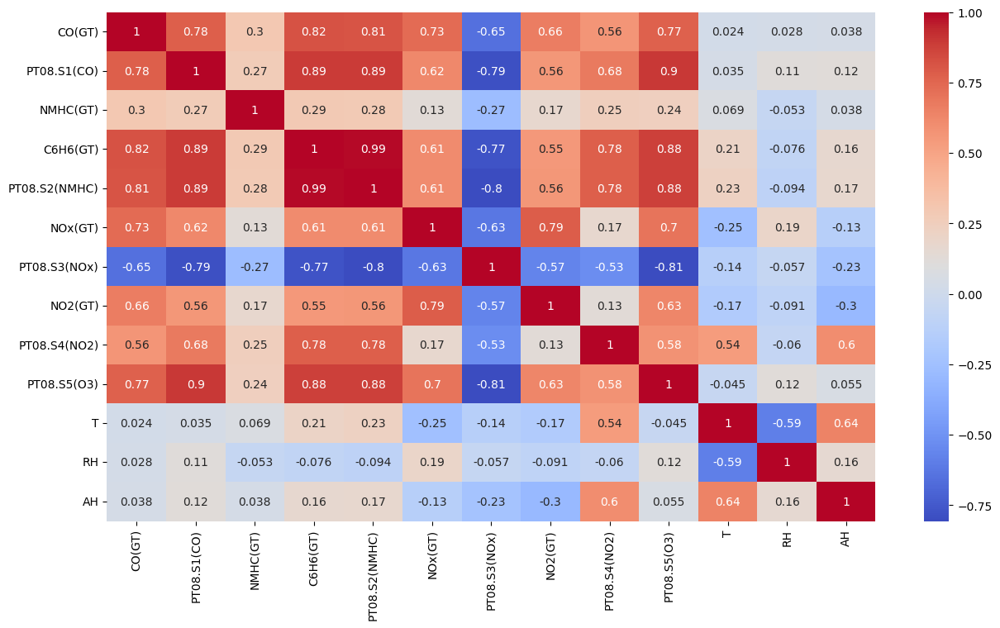

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 8))
corr = new_df.select_dtypes(include=['number']).corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

In [32]:
co_df = new_df.drop('NMHC(GT)', axis=1)
# no2_df = new_df.drop('CO(GT)', axis=1)

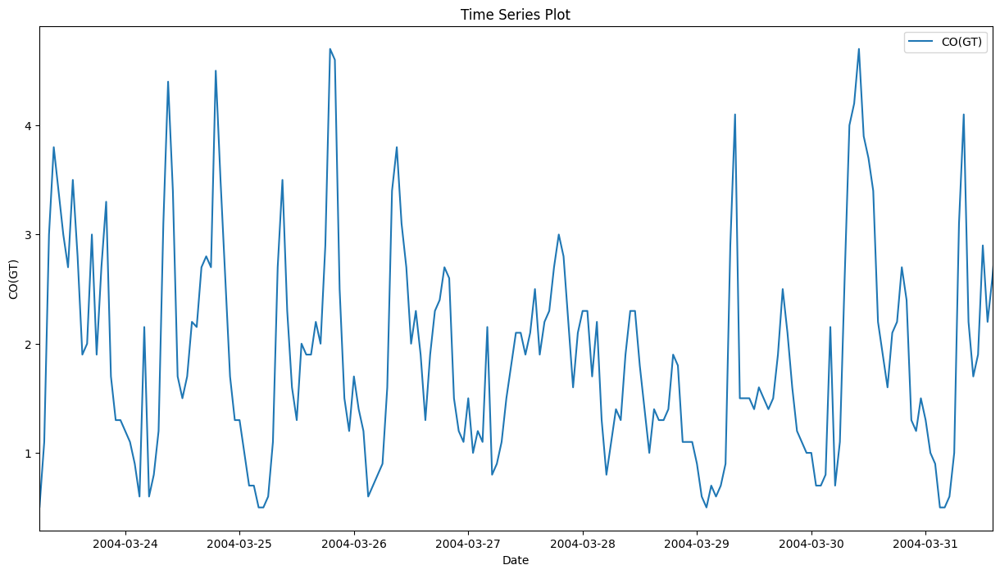

In [33]:
plt.figure(figsize=(15, 8))
plt.plot(co_df.index, co_df['CO(GT)'], label='CO(GT)')
plt.title('Time Series Plot')
plt.xlabel('Date')
plt.ylabel('CO(GT)')
plt.legend()

# print(co_df.index)
# Set x-axis limits
plt.xlim(co_df.index[300], co_df.index[500])

plt.show()


In [34]:
co_df.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH'],
      dtype='object')

<Axes: xlabel='DateTime'>

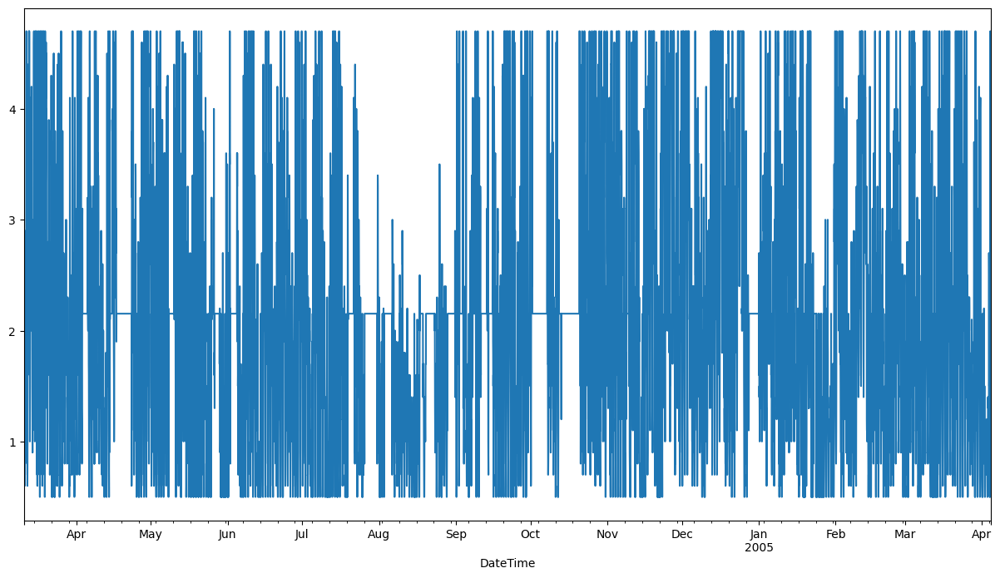

In [35]:
co_df.resample(rule='h')['CO(GT)'].mean().plot(figsize=(15, 8))


### 3. Feature Engineering
- Create lag features for `CO(GT)` to incorporate historical values.

In [36]:
for i in co_df.columns:
  # co_df[f'{i}_lag_1'] = co_df[i].rolling(50).mean()
  # co_df[f'{i}_lag_1'] = co_df[i].ewm(span=5).mean()
  co_df[f'{i}_lag_1'] = co_df[i] - co_df[i].shift(6)

In [37]:
# co_df.dropna(inplace=True)

In [38]:
co_df.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH', 'CO(GT)_lag_1', 'PT08.S1(CO)_lag_1', 'C6H6(GT)_lag_1',
       'PT08.S2(NMHC)_lag_1', 'NOx(GT)_lag_1', 'PT08.S3(NOx)_lag_1',
       'NO2(GT)_lag_1', 'PT08.S4(NO2)_lag_1', 'PT08.S5(O3)_lag_1', 'T_lag_1',
       'RH_lag_1', 'AH_lag_1'],
      dtype='object')

In [39]:
co_df.reset_index(inplace=True)

In [40]:
co_df.set_index('DateTime', inplace=True)

In [41]:
co_df.index

DatetimeIndex(['2004-03-10 18:00:00', '2004-03-10 19:00:00',
               '2004-03-10 20:00:00', '2004-03-10 21:00:00',
               '2004-03-10 22:00:00', '2004-03-10 23:00:00',
               '2004-03-11 00:00:00', '2004-03-11 01:00:00',
               '2004-03-11 02:00:00', '2004-03-11 03:00:00',
               ...
               '2005-04-04 05:00:00', '2005-04-04 06:00:00',
               '2005-04-04 07:00:00', '2005-04-04 08:00:00',
               '2005-04-04 09:00:00', '2005-04-04 10:00:00',
               '2005-04-04 11:00:00', '2005-04-04 12:00:00',
               '2005-04-04 13:00:00', '2005-04-04 14:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=9357, freq=None)

In [42]:
# co_df = co_df.resample('h').mean()

for column in ['CO(GT)_lag_1', 'PT08.S1(CO)_lag_1',
       'C6H6(GT)_lag_1', 'PT08.S2(NMHC)_lag_1', 'NOx(GT)_lag_1', 'PT08.S3(NOx)_lag_1',
       'NO2(GT)_lag_1', 'PT08.S4(NO2)_lag_1', 'PT08.S5(O3)_lag_1', 'T_lag_1', 'RH_lag_1',
       'AH_lag_1']:
    data_for_adf = co_df[column].dropna()
    result = adfuller(data_for_adf)
    print(f"ADF Test for {column}:")
    print("ADF Statistic:", result[0])
    print("p-value:", result[1])

    if result[1] > 0.05:
        print("The series is not stationary. Differencing will be applied.")
        co_df[f'{column}_log'] = co_df[column].diff().dropna()
    else:
        print("The series is stationary. Proceeding without differencing.")

ADF Test for CO(GT)_lag_1:
ADF Statistic: -18.921219461351686
p-value: 0.0
The series is stationary. Proceeding without differencing.
ADF Test for PT08.S1(CO)_lag_1:
ADF Statistic: -18.84441173082054
p-value: 0.0
The series is stationary. Proceeding without differencing.
ADF Test for C6H6(GT)_lag_1:
ADF Statistic: -18.962218112557764
p-value: 0.0
The series is stationary. Proceeding without differencing.
ADF Test for PT08.S2(NMHC)_lag_1:
ADF Statistic: -19.16912678643304
p-value: 0.0
The series is stationary. Proceeding without differencing.
ADF Test for NOx(GT)_lag_1:
ADF Statistic: -19.867738608176058
p-value: 0.0
The series is stationary. Proceeding without differencing.
ADF Test for PT08.S3(NOx)_lag_1:
ADF Statistic: -19.782650027165733
p-value: 0.0
The series is stationary. Proceeding without differencing.
ADF Test for NO2(GT)_lag_1:
ADF Statistic: -18.805481538558656
p-value: 2.022652271939042e-30
The series is stationary. Proceeding without differencing.
ADF Test for PT08.S4(NO2

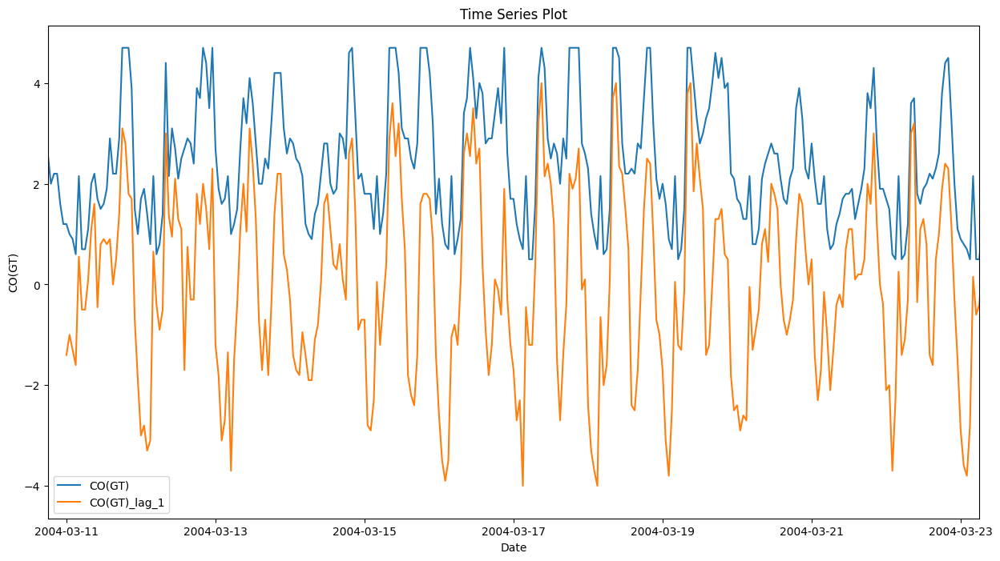

In [43]:
# co_df[['CO(GT)','CO(GT)_lag_1']].plot(figsize=(15, 8))
plt.figure(figsize=(15, 8))
plt.plot(co_df.index, co_df['CO(GT)'], label='CO(GT)')
plt.plot(co_df['CO(GT)_lag_1'], label='CO(GT)_lag_1')
plt.title('Time Series Plot')
plt.xlabel('Date')
plt.ylabel('CO(GT)')
plt.legend()

# print(co_df.index)
# Set x-axis limits
plt.xlim(co_df.index[0], co_df.index[300])

plt.show()


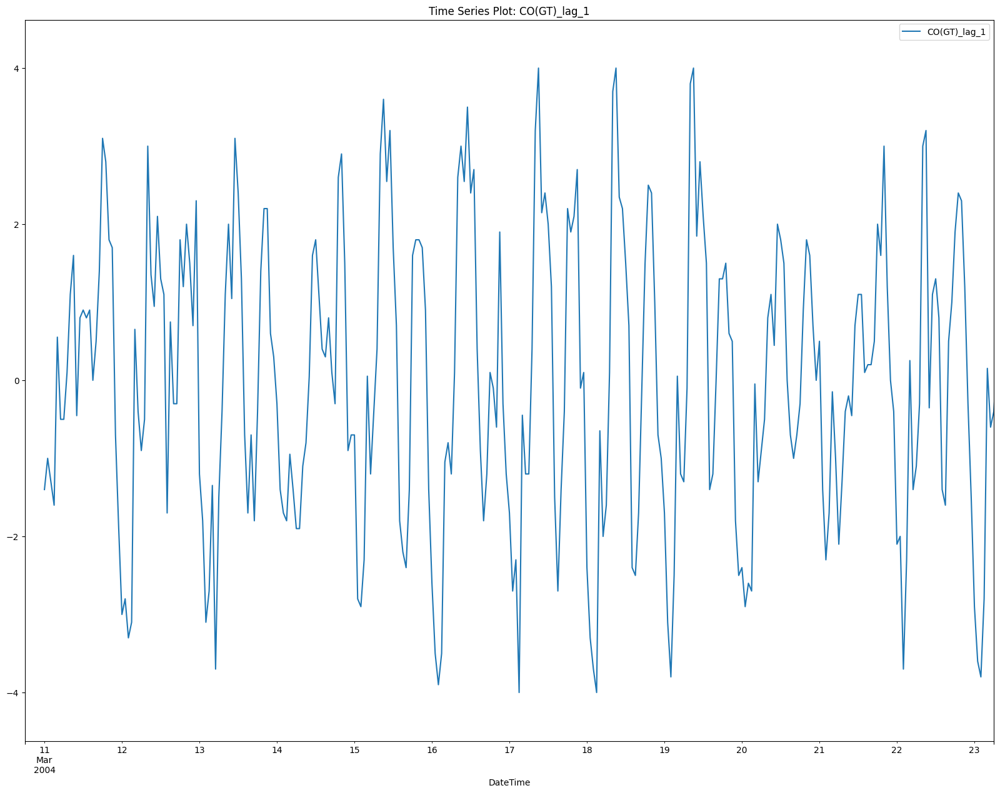

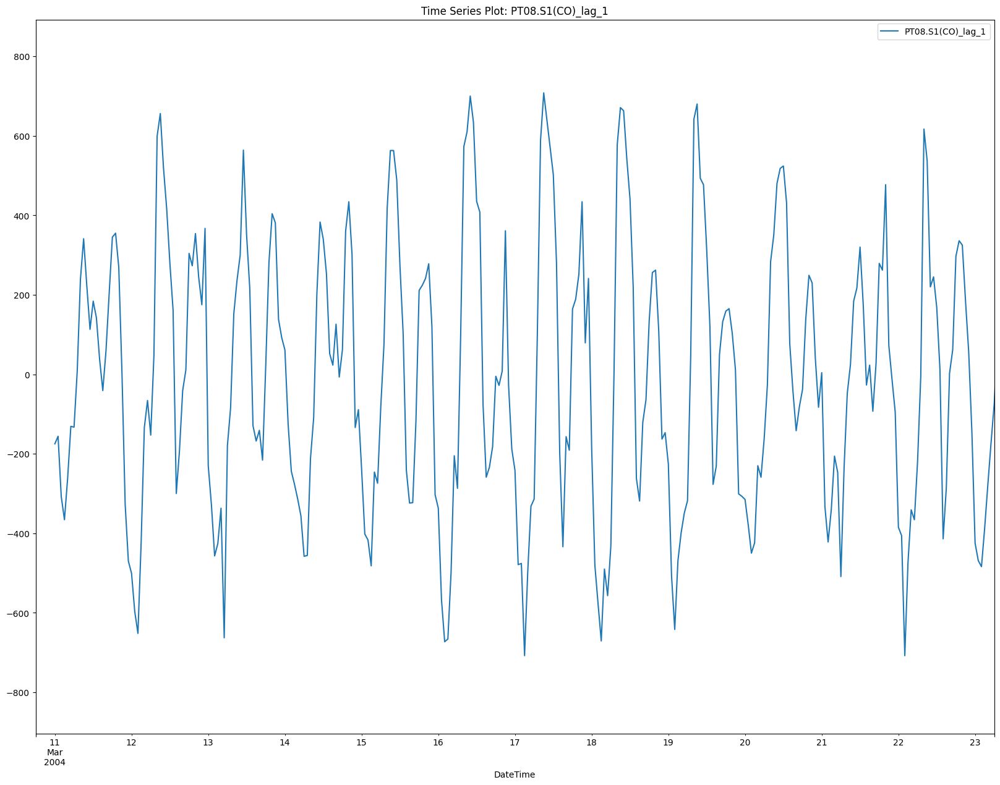

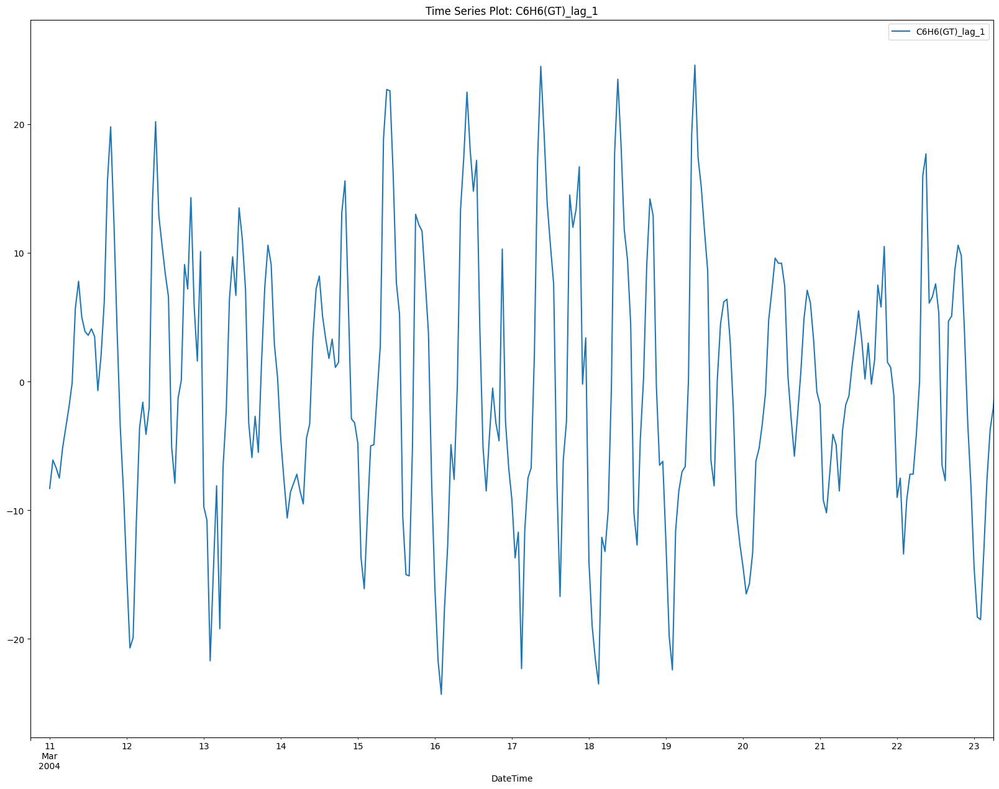

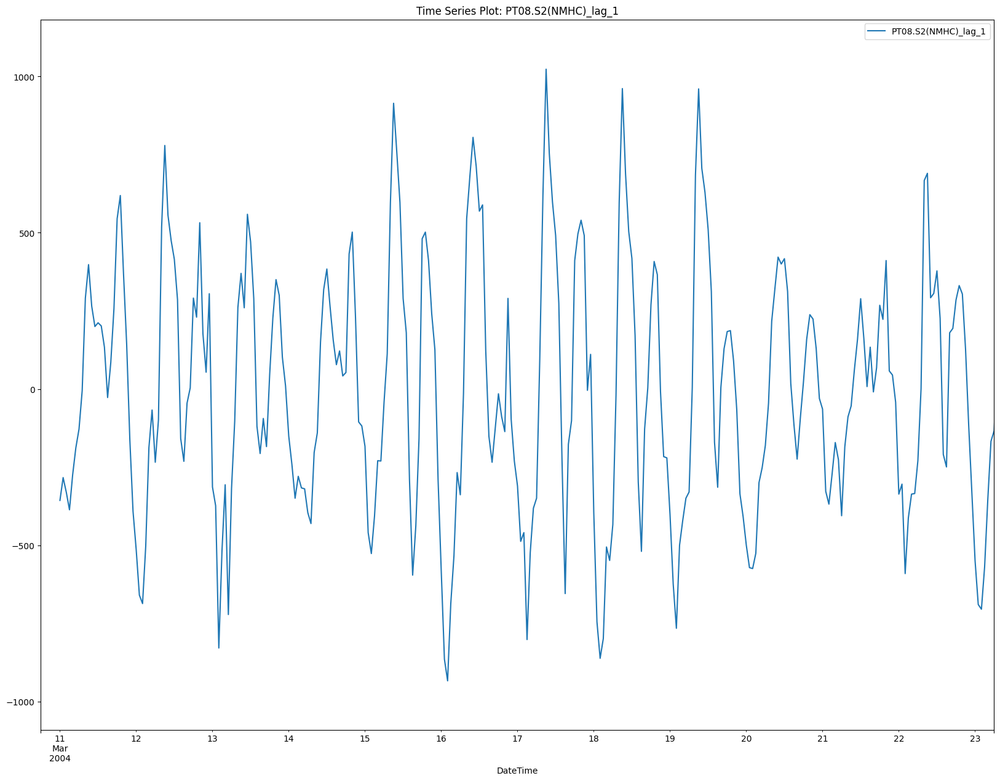

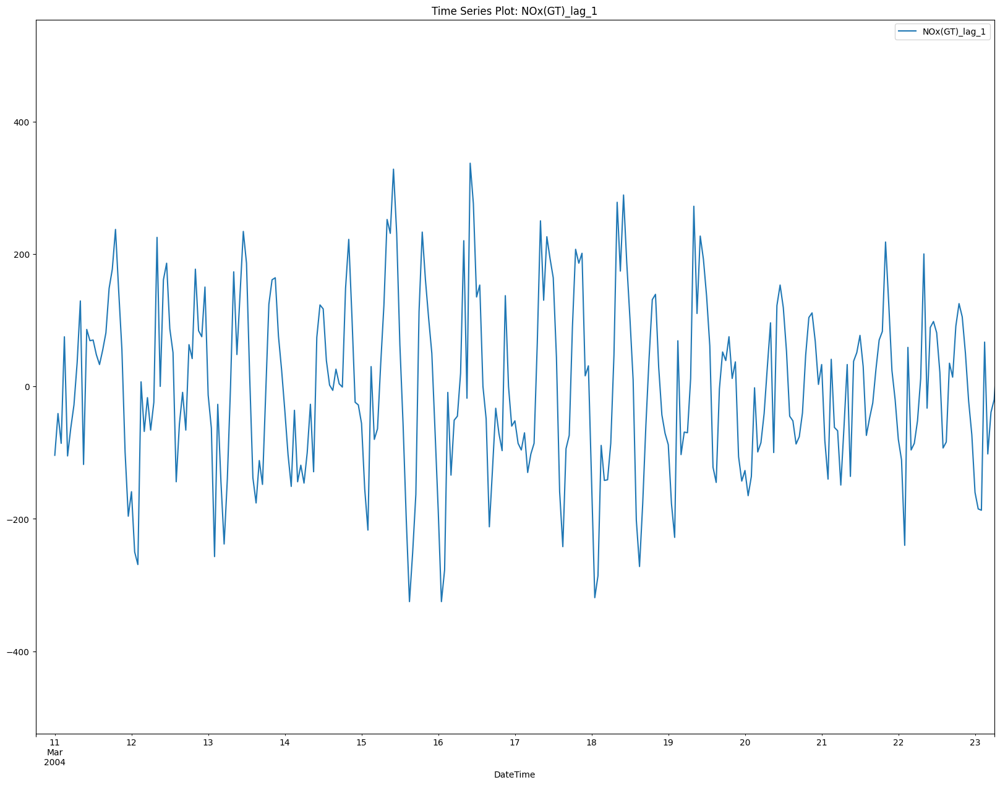

...

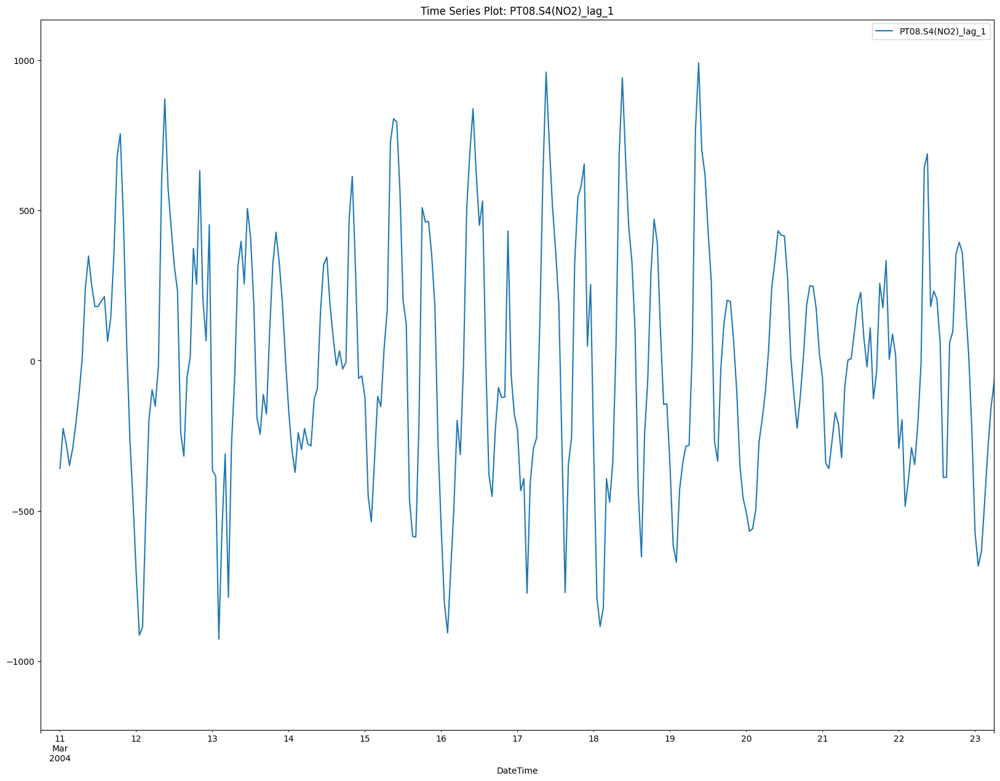

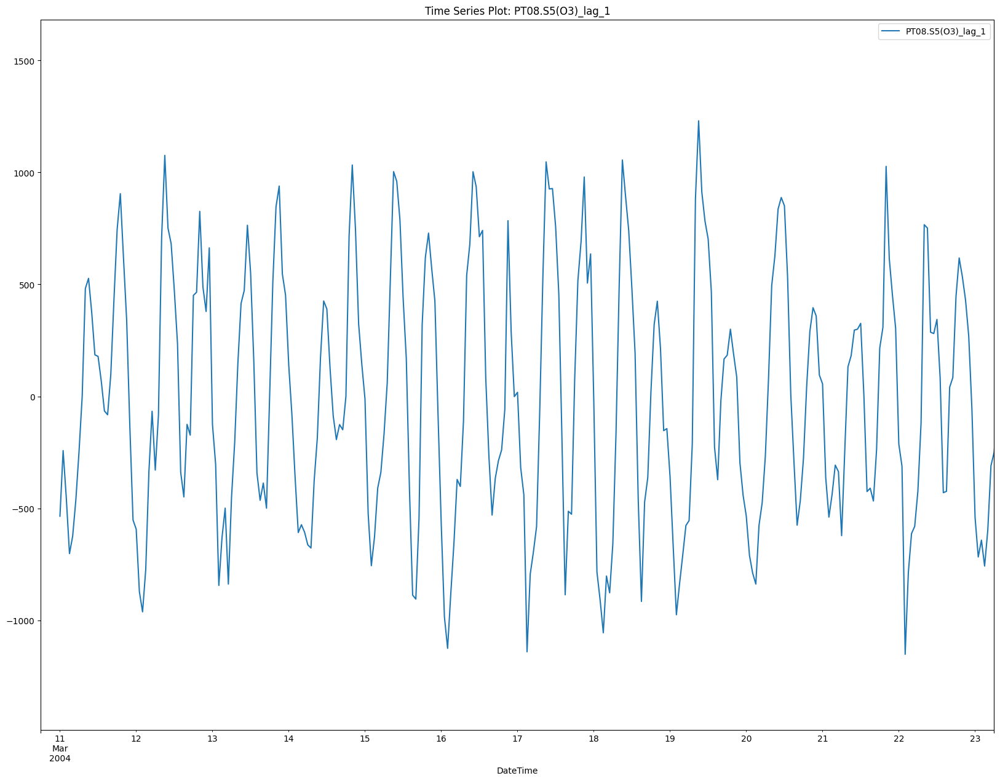

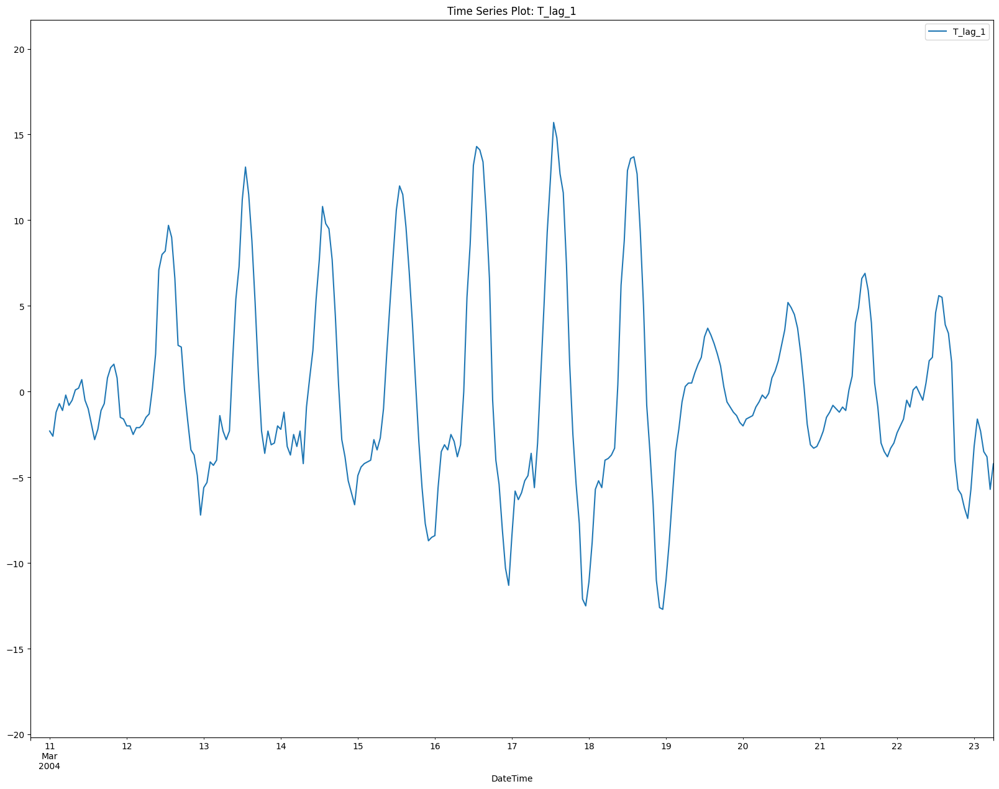

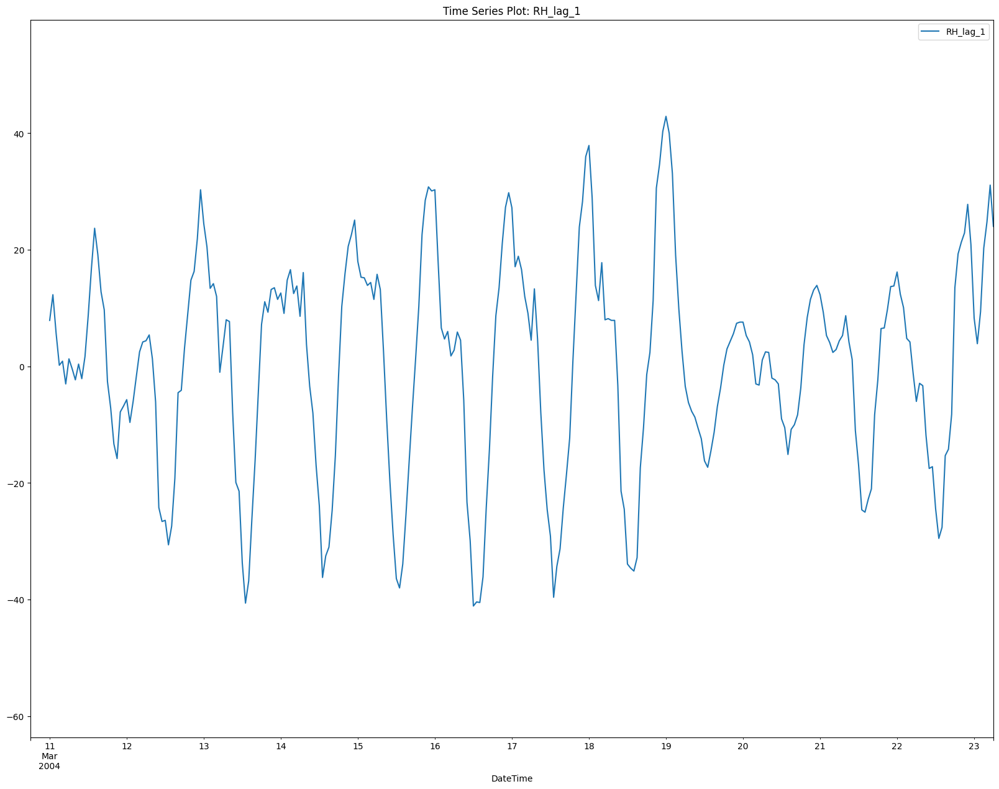

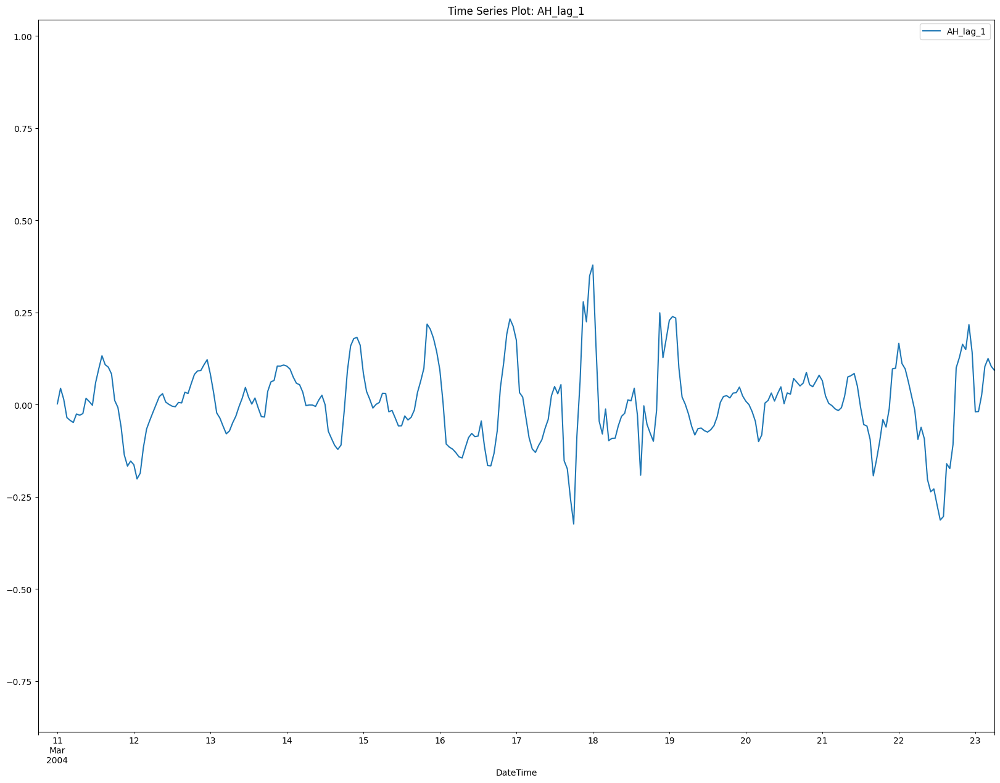

In [44]:
for column in ['CO(GT)_lag_1', 'PT08.S1(CO)_lag_1',
       'C6H6(GT)_lag_1', 'PT08.S2(NMHC)_lag_1', 'NOx(GT)_lag_1', 'PT08.S3(NOx)_lag_1',
       'NO2(GT)_lag_1', 'PT08.S4(NO2)_lag_1', 'PT08.S5(O3)_lag_1', 'T_lag_1', 'RH_lag_1',
       'AH_lag_1']:
    co_df[column].plot(title=f"Time Series Plot: {column}", figsize=(20, 15), xlim=[co_df.index[0],co_df.index[300]])
    plt.legend()
    plt.show()


In [45]:
co_df.head(5)

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,CO(GT)_lag_1,PT08.S1(CO)_lag_1,C6H6(GT)_lag_1,PT08.S2(NMHC)_lag_1,NOx(GT)_lag_1,PT08.S3(NOx)_lag_1,NO2(GT)_lag_1,PT08.S4(NO2)_lag_1,PT08.S5(O3)_lag_1,T_lag_1,RH_lag_1,AH_lag_1
DateTime,,,,,,,,,,,,,,,,,,,,,,,,
2004-03-10 18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-03-10 19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-03-10 20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-03-10 21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-03-10 22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


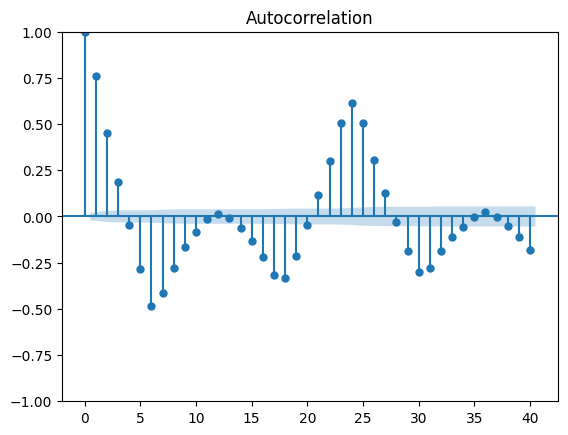

<Figure size 1500x800 with 0 Axes>

In [46]:
acf_plot = plot_acf(co_df['CO(GT)_lag_1'].dropna())
plt.figure(figsize=(15, 8))
plt.show()

<Figure size 1500x1500 with 0 Axes>

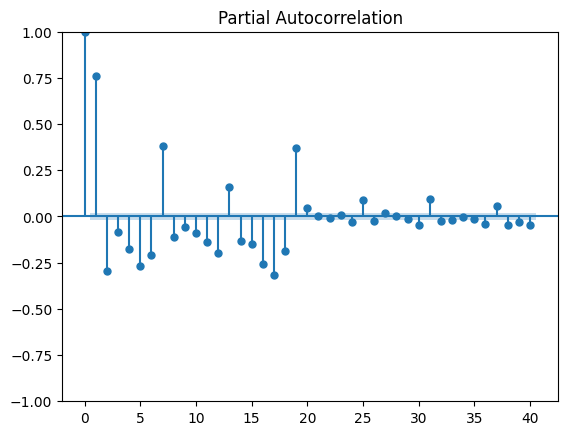

In [47]:
plt.figure(figsize=(15, 15))
pacf = plot_pacf(co_df['CO(GT)_lag_1'].dropna())
plt.show()

### 4. Time-Series Forecasting
- Train separate models for **CO(GT)**.
- Explore the following forecasting approaches:
  - **Statistical Models**:
    - Classical models like ARIMA or SARIMA for univariate forecasting.
  - **Machine Learning Models**:
    - Use regression models trained on lag features and external predictors.
  - **Deep Learning Models**:
    - Apply LSTM, GRU, or other RNN-based models for sequence forecasting.
- Evaluate and compare the models.


In [48]:
co_df.dropna(inplace=True)

In [44]:
co_df.head(10)

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,CO(GT)_lag_1,PT08.S1(CO)_lag_1,C6H6(GT)_lag_1,PT08.S2(NMHC)_lag_1,NOx(GT)_lag_1,PT08.S3(NOx)_lag_1,NO2(GT)_lag_1,PT08.S4(NO2)_lag_1,PT08.S5(O3)_lag_1,T_lag_1,RH_lag_1,AH_lag_1
DateTime,,,,,,,,,,,,,,,,,,,,,,,,
2004-03-11 00:00:00,1.20000,1185.0,3.6,690.0,62.000000,1401.0,77.000000,1333.0,733.0,11.3,56.8,0.7603,-1.40000,-175.0,-8.3,-356.0,-104.000000,345.0,-36.000000,-359.0,-535.0,-2.3,7.9,0.0025
2004-03-11 01:00:00,1.00000,1136.0,3.3,672.0,62.000000,1401.0,76.000000,1333.0,730.0,10.7,60.0,0.7702,-1.00000,-156.0,-6.1,-283.0,-41.000000,227.0,-16.000000,-226.0,-242.0,-2.6,12.3,0.0447
2004-03-11 02:00:00,0.90000,1094.0,2.3,609.0,45.000000,1401.0,62.500000,1276.0,620.0,10.7,59.7,0.7648,-1.30000,-308.0,-6.7,-330.0,-86.000000,261.0,-51.500000,-279.0,-454.0,-1.2,5.7,0.0146
2004-03-11 03:00:00,0.60000,1010.0,1.7,562.0,246.896735,1401.0,113.091251,1235.0,501.0,10.3,60.2,0.7517,-1.60000,-366.0,-7.5,-386.0,74.896735,309.0,-8.908749,-349.0,-702.0,-0.7,0.2,-0.0350
2004-03-11 04:00:00,2.15275,1011.0,1.3,562.0,26.000000,1401.0,62.500000,1197.0,485.5,10.1,60.5,0.7465,0.55275,-261.0,-5.2,-274.0,-105.000000,196.0,-53.500000,-293.0,-624.5,-1.1,0.9,-0.0423
2004-03-11 05:00:00,0.70000,1066.0,1.1,562.0,26.000000,1401.0,62.500000,1182.0,485.5,11.0,56.2,0.7366,-0.50000,-131.0,-3.6,-188.0,-63.000000,64.0,-33.500000,-211.0,-463.5,-0.2,-3.0,-0.0482
2004-03-11 06:00:00,0.70000,1052.0,1.6,562.0,34.000000,1401.0,62.500000,1221.0,485.5,10.5,58.1,0.7353,-0.50000,-133.0,-2.0,-128.0,-28.000000,0.0,-14.500000,-112.0,-247.5,-0.8,1.3,-0.0250
2004-03-11 07:00:00,1.10000,1144.0,3.2,667.0,98.000000,1401.0,82.000000,1339.0,730.0,10.2,59.6,0.7417,0.10000,8.0,-0.1,-5.0,36.000000,0.0,6.000000,6.0,0.0,-0.5,-0.4,-0.0285
2004-03-11 08:00:00,2.00000,1333.0,8.0,900.0,174.000000,1136.0,112.000000,1517.0,1102.0,10.8,57.4,0.7408,1.10000,239.0,5.7,291.0,129.000000,-265.0,49.500000,241.0,482.0,0.1,-2.3,-0.0240


##### ARIMA

g:\ML\Time Series Forecasting of Carbon Monoxide\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
g:\ML\Time Series Forecasting of Carbon Monoxide\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
g:\ML\Time Series Forecasting of Carbon Monoxide\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
g:\ML\Time Series Forecasting of Carbon Monoxide\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:                 CO(GT)   No. Observations:                 9351
Model:                 ARIMA(7, 1, 1)   Log Likelihood               -5212.973
Date:                Sun, 19 Jan 2025   AIC                          10453.945
Time:                        10:31:34   BIC                          10553.949
Sample:                    03-11-2004   HQIC                         10487.909
                         - 04-04-2005                                         
Covariance Type:                  opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
PT08.S1(CO)       0.0010      0.000      9.356      0.000       0.001       0.001
C6H6(GT)          0.1443      0.005     31.121      0.000       0.135       0.153
PT08.S2(NMHC)    -0.0018      0.000    -

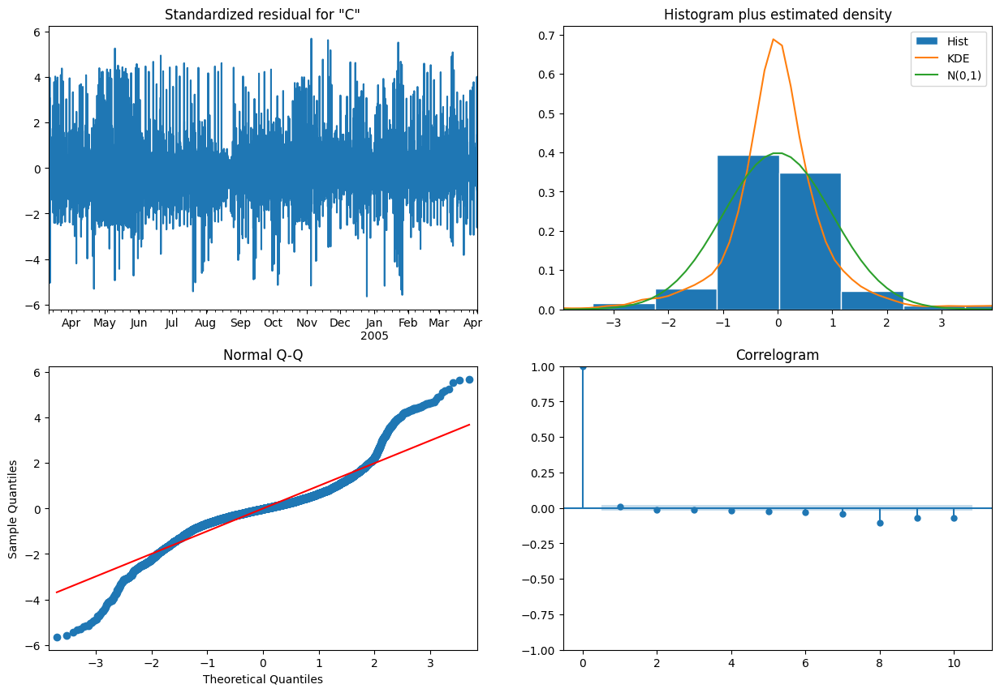

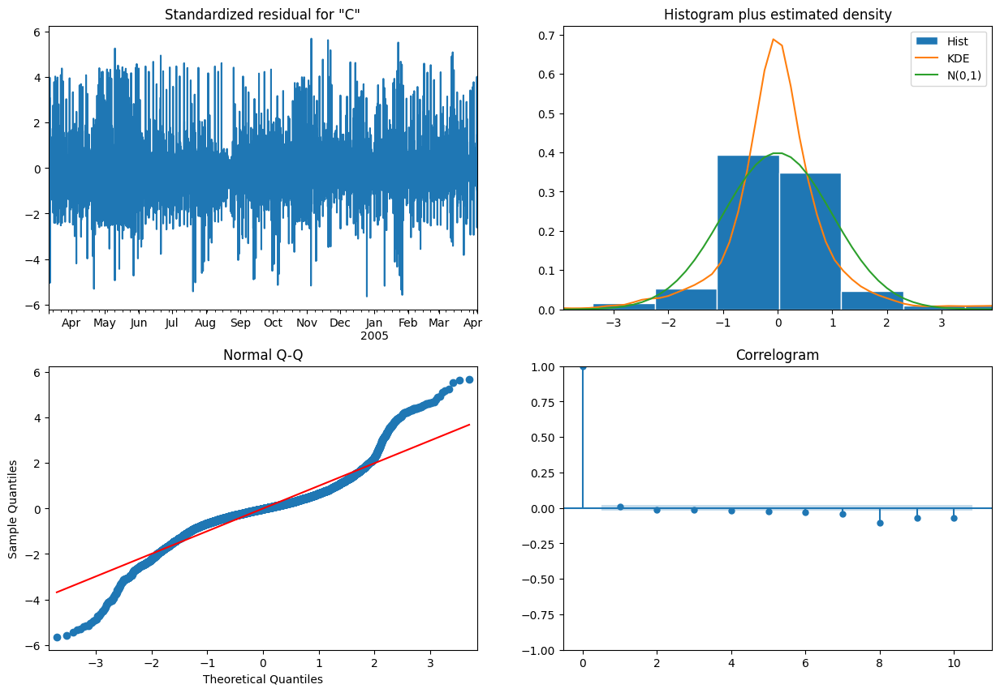

In [50]:
from statsmodels.tsa.arima.model import ARIMA

arima = ARIMA(co_df['CO(GT)'], exog=co_df[['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'NO2(GT)']], order=(7, 1, 1))
arima_model = arima.fit()
print(arima_model.summary())
arima_model.plot_diagnostics(figsize=(15, 10))


##### SARIMA

g:\ML\Time Series Forecasting of Carbon Monoxide\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)
g:\ML\Time Series Forecasting of Carbon Monoxide\.venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency h will be used.
  self._init_dates(dates, freq)


                                     SARIMAX Results                                      
Dep. Variable:                             CO(GT)   No. Observations:                 9351
Model:             SARIMAX(2, 1, 1)x(1, 1, 1, 24)   Log Likelihood               -4375.178
Date:                            Sun, 19 Jan 2025   AIC                           8776.356
Time:                                    17:29:40   BIC                           8869.183
Sample:                                03-11-2004   HQIC                          8807.886
                                     - 04-04-2005                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
PT08.S1(CO)       0.0010      0.000      9.521      0.000       0.001       0.001
C6H6(GT)          0.1533  

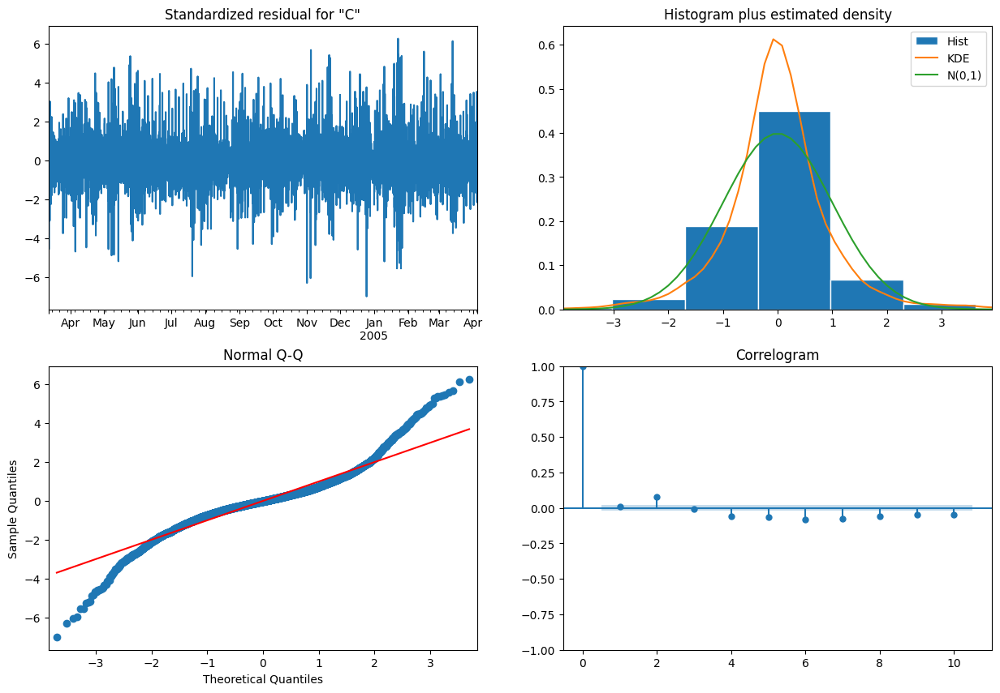

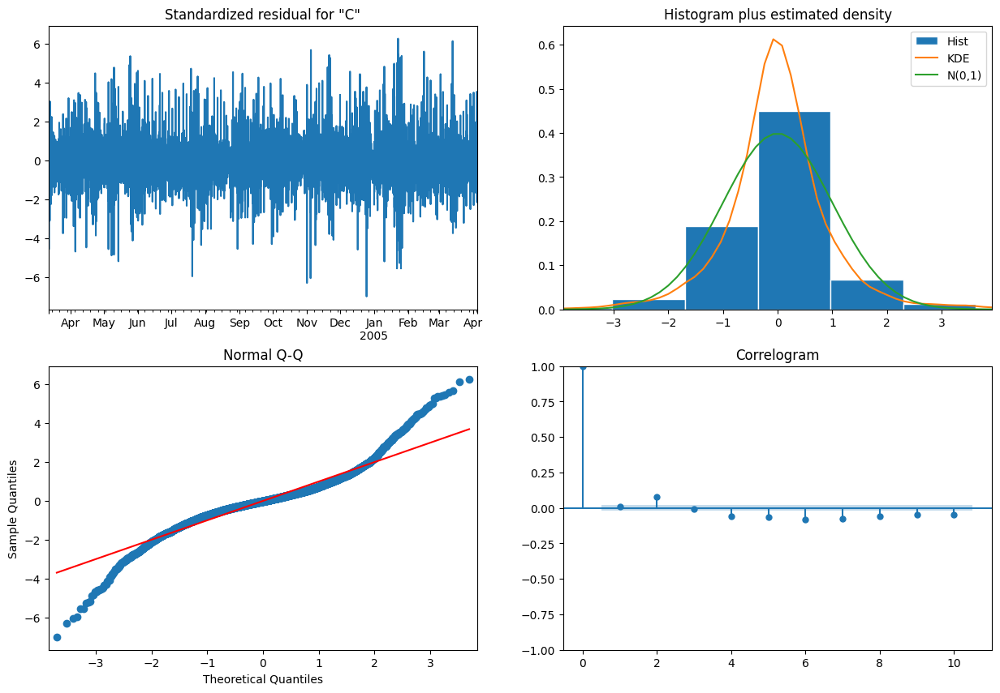

In [125]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(co_df['CO(GT)'].dropna(), exog=co_df[['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S5(O3)']].dropna(), order=(2, 1, 1), seasonal_order=(1, 1, 1, 24))
results = model.fit()

print(results.summary())
results.plot_diagnostics(figsize=(15, 10))

### 5. Model Evaluation
- Use appropriate metrics for forecasting:
  - Mean Absolute Error (MAE)
  - Root Mean Squared Error (RMSE)
  - Mean Absolute Percentage Error (MAPE)
- Plot actual vs. predicted values to visualize performance.


#### CO LSTM

In [108]:
# Prepare the dataset
features = ['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)',
            'PT08.S5(O3)']
target = 'CO(GT)'

scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(co_df[features])

def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i+seq_length, :-1])
        y.append(data[i+seq_length, -1])
    return np.array(X), np.array(y)

seq_length = 24
X, y = create_sequences(scaled_data, seq_length)

train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Define the model-building function for Keras Tuner
def build_model(hp):
    model = Sequential()
    model.add(LSTM(units=hp.Int('units_1', min_value=50, max_value=200, step=50),
                   return_sequences=True,
                   input_shape=(X_train.shape[1], X_train.shape[2])))
    
    model.add(LSTM(units=hp.Int('units_2', min_value=50, max_value=200, step=50)))
    model.add(Dense(1))
    model.compile(
        optimizer=hp.Choice('optimizer', values=['adam', 'rmsprop']),
        loss='mean_squared_error'
    )
    
    return model

# Initialize Keras Tuner with RandomSearch or Hyperband
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=5, 
    executions_per_trial=3, 
    directory='kt_dir', 
    project_name='lstm_tuning'
)


tuner.search(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

best_model = tuner.get_best_models(1)[0]
print("Evalutate: ", best_model.evaluate(X_test, y_test))

# Evaluate the best model
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error of Best Model: {mse}")

# Optionally, print the best hyperparameters
best_hyperparameters = tuner.get_best_hyperparameters(1)[0]
print(f"Best Hyperparameters: {best_hyperparameters.values}")


Trial 5 Complete [00h 08m 52s]
val_loss: 0.013969543389976025

Best val_loss So Far: 0.013758467510342598
Total elapsed time: 00h 45m 19s


g:\ML\Time Series Forecasting of Carbon Monoxide\.venv\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0141
Evalutate:  0.013568410649895668
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Mean Squared Error of Best Model: 0.013568410294677117
Best Hyperparameters: {'units_1': 50, 'units_2': 150, 'optimizer': 'adam'}


In [109]:
r2 = r2_score(y_test, y_pred)
print("R-squared:", r2)

R-squared: 0.8129871299855906


59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
RMSE: 179.26813637553926


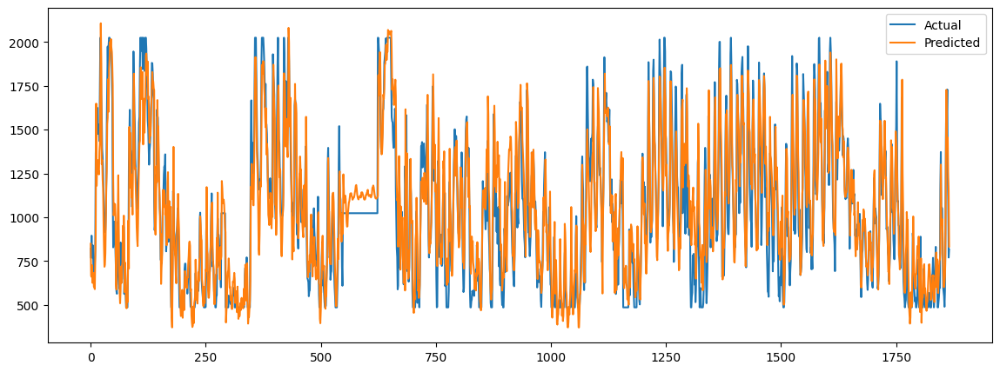

In [110]:
y_pred = best_model.predict(X_test)
y_pred = scaler.inverse_transform(np.concatenate((np.zeros((y_pred.shape[0], X_test.shape[2])), y_pred), axis=1))[:, -1]
y_test = scaler.inverse_transform(np.concatenate((np.zeros((y_test.shape[0], X_test.shape[2])), y_test.reshape(-1, 1)), axis=1))[:, -1]

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'RMSE: {rmse}')

plt.figure(figsize=(14, 5))
plt.plot(y_test, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()


#### CO Dataset Randomforest Tree

In [114]:
x_train, x_test, y_train, y_test = train_test_split(co_df[['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)',
            'PT08.S5(O3)']], co_df[['CO(GT)']], test_size=0.2, random_state=42)
rf = RandomForestRegressor()

param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [10, 15, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False]
}

grid_search_rf = GridSearchCV(rf, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_rf.fit(x_train, y_train)

print("Best Parameters for Random Forest: ", grid_search_rf.best_params_)
print("Best Score (Negative MSE) for Random Forest: ", grid_search_rf.best_score_)


g:\ML\Time Series Forecasting of Carbon Monoxide\.venv\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Best Parameters for Random Forest:  {'bootstrap': False, 'max_depth': 10, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 500}
Best Score (Negative MSE) for Random Forest:  -0.2163347133832791


In [116]:
rf = RandomForestRegressor(bootstrap= False, max_depth= 10, max_features= 'log2', min_samples_leaf= 4, min_samples_split= 5, n_estimators= 500)
rf.fit(x_train, y_train)
rf.score(x_test, y_test)

g:\ML\Time Series Forecasting of Carbon Monoxide\.venv\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


0.8414040836215936

#### CO Time Series PREDICTION MODEL EVALUATION

In [126]:
co_df.dropna(inplace=True)
y_actual = co_df['CO(GT)']
y_predicted = results.predict( start=co_df.index[0], end=co_df.index[-1])

# Calculate Metrics
mae = mean_absolute_error(y_actual, y_predicted)
rmse = np.sqrt(mean_squared_error(y_actual, y_predicted))
mape = np.mean(np.abs((y_actual - y_predicted) / y_actual)) * 100

# Print Metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}%")

Mean Absolute Error (MAE): 0.26276801673307004
Root Mean Squared Error (RMSE): 0.3886103886479773
Mean Absolute Percentage Error (MAPE): 17.671239480713147%


### 6. Visualization and Insights
- Generate forecasts for future dates and visualize the trends.
- Highlight seasonal patterns, peak times, and periods of concern.
- Provide actionable recommendations based on predicted trends.



#### CO Time Series

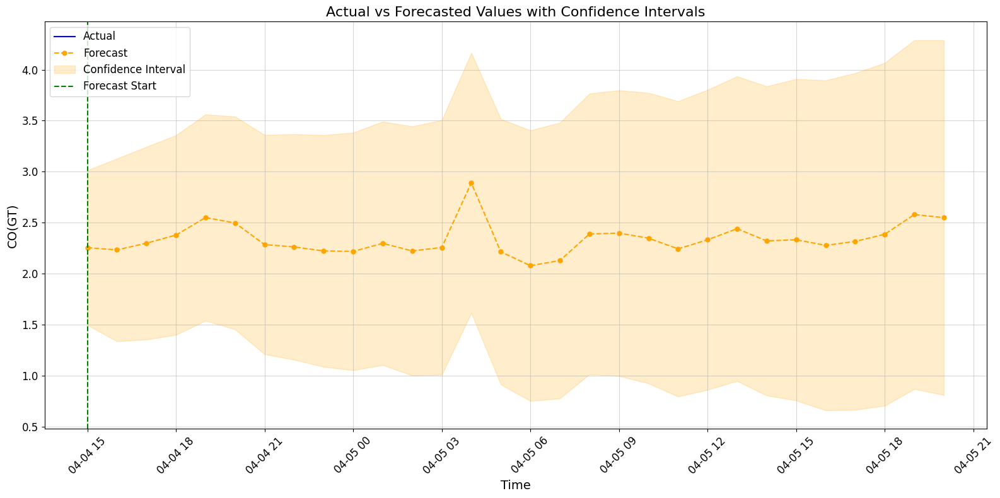

In [127]:
future_steps = 30
last_exog = co_df[['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S5(O3)']].iloc[-1].values.reshape(1, -1)

future_exog = pd.DataFrame(np.repeat(last_exog, future_steps, axis=0),
                          index=pd.date_range(start=co_df.index[-1], periods=future_steps + 1, freq='h')[1:],
                          columns=['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S5(O3)'])
forecast = results.get_forecast(steps=future_steps, exog=future_exog)
forecast_index = pd.date_range(start=co_df.index[-1], periods=future_steps + 1, freq='h')[1:]
forecast_values = forecast.predicted_mean
forecast_ci = forecast.conf_int()

# Assign forecast index
forecast_values.index = forecast_index
forecast_ci.index = forecast_index

# Enhanced Plot for Better Visibility
plt.figure(figsize=(16, 8))

# Plot actual values
plt.plot(y_actual[-1:0], label='Actual', color='blue', linewidth=1.5)

# Plot forecasted values
plt.plot(forecast_values, label='Forecast', color='orange', marker='o', markersize=5, linestyle='--')

# Plot confidence intervals
plt.fill_between(forecast_ci.index,
                 forecast_ci.iloc[:, 0],
                 forecast_ci.iloc[:, 1], color='orange', alpha=0.2, label='Confidence Interval')

# Add a vertical line to indicate where the forecast starts
plt.axvline(x=forecast_index[0], color='green', linestyle='--', label='Forecast Start')

plt.title('Actual vs Forecasted Values with Confidence Intervals', fontsize=16)
plt.xlabel('Time', fontsize=14)
plt.ylabel('CO(GT)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(alpha=0.5)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()



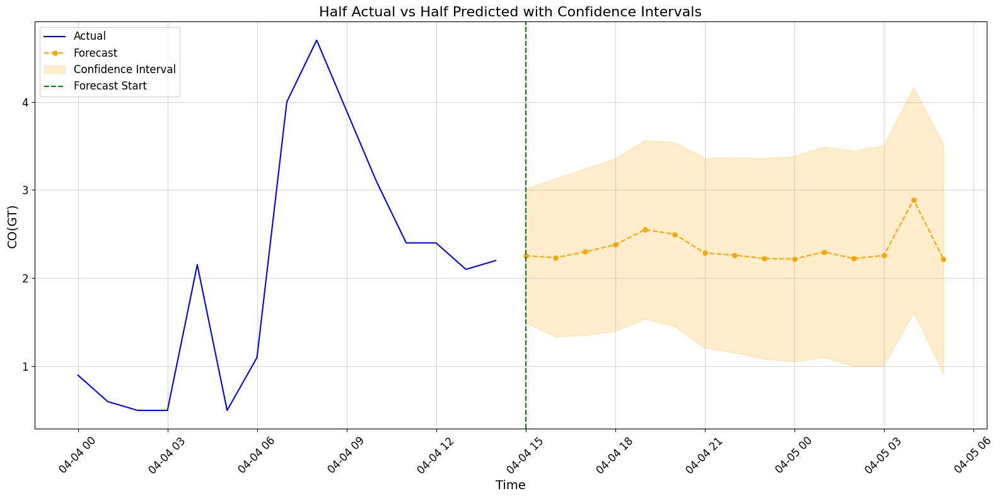

In [128]:
# Define the length of the data to display
total_points = 30
actual_points = total_points // 2

# Get the last portion of actual data and forecast data
recent_actual = y_actual[-actual_points:]
forecast_values_limited = forecast_values[:total_points - actual_points]
forecast_ci_limited = forecast_ci.iloc[:total_points - actual_points]

# Combine actual and predicted for plotting
combined_index = list(recent_actual.index) + list(forecast_values_limited.index)
combined_values = pd.concat([recent_actual, forecast_values_limited])

# Enhanced Plot for Half Actual and Half Predicted
plt.figure(figsize=(16, 8))

# Plot actual values
plt.plot(recent_actual, label='Actual', color='blue', linewidth=1.5)

# Plot forecasted values
plt.plot(forecast_values_limited, label='Forecast', color='orange', marker='o', markersize=5, linestyle='--')

# Plot confidence intervals for the forecasted data
plt.fill_between(forecast_ci_limited.index,
                 forecast_ci_limited.iloc[:, 0],
                 forecast_ci_limited.iloc[:, 1], color='orange', alpha=0.2, label='Confidence Interval')

# Add a vertical line to separate actual and forecasted regions
plt.axvline(x=forecast_values_limited.index[0], color='green', linestyle='--', label='Forecast Start')

plt.title('Half Actual vs Half Predicted with Confidence Intervals', fontsize=16)
plt.xlabel('Time', fontsize=14)
plt.ylabel('CO(GT)', fontsize=14)

plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(alpha=0.5)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()
